In [1]:
pip install ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.7/46.7 kB 731.6 kB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 2.8 MB/s eta 0:00:00
  Attempting uninstall: cloudpickle
    Found existing installation: cloudpickle 3.1.0
    Uninstalling cloudpickle-3.1.0:
      Successfully uninstalled cloudpickle-3.1.0
Note: you may need to restart the kernel to use updated packages.


In [2]:
from ultralytics import YOLO
import yaml
import torch
from PIL import Image
from IPython.display import display
import os
import seaborn as sns
import matplotlib.pyplot as plt
import glob
import cv2
import random
import pandas as pd

Creating new Ultralytics Settings v0.0.8 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/usage/settings.


In [3]:
train = "/kaggle/input/license-plate-dataset/archive/images/train"
val = "/kaggle/input/license-plate-dataset/archive/images/val"

In [4]:
data_yaml_content = {
    'train': train,
    'val': val,
    'nc': 1,
    'names': {0: 'license_plate'}
}

yaml_path = "/kaggle/working/data.yaml"


with open(yaml_path, "w") as f:
    yaml.dump(data_yaml_content, f, default_flow_style=False)

### 4️⃣ Training My YOLO Model ! 🚀

 I just unleashed my YOLO model with YOLO("yolov8s.pt").

it's ready to learn. 💥

 Then, I set up the training party: 40 epochs, 32 batch size, and 640x640 images. 🎉 

The model's on a GPU (device=0) with a helper squad of 2 workers. 👷‍♂️👷‍♀️

 I even gave it a personalized project name—"BEAST"—because why not? 😎 

Plus, I added some cool tricks like mosaic and color tweaks with HSV.

#### Let's train this beast to recognize license plates! 🏎️💨

In [5]:
model = YOLO("yolov8s.pt")

results = model.train(data="/kaggle/working/data.yaml",
                      epochs=40,
                        batch=32,
                          imgsz=640,
                      device=0,
                        workers=2,
                          project='LPD',
                            mosaic=True,
                              weight_decay=0.0005,
                      hsv_h=0.015,
                        hsv_s=0.7,
                          hsv_v=0.4,
                              save_period=20,
                      optimizer="SGD")


Ultralytics 8.4.157 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 14912MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=32, bgr=0.0, box=7.5, cache=False, cfg=None, channels_last=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, cls_remap=True, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dgrad=0.5, dis=6.0, distill_model=None, dlam=1.0, dlog=1.0, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=40, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8s.pt, momentum=0.937, mosaic=True, multi_scale=0.0, name=train, nbs=64, nms=None, opset=None, optimize=Fals

/usr/local/lib/python3.10/dist-packages/ray/train/_internal/session.py:657: UserWarning: `get_trial_id` is meant to only be called inside a function that is executed by a Tuner or Trainer. Returning `None`.
  warnings.warn(


       2/40      6.36G     0.8061     0.6499     0.9301         38        640: 100% ━━━━━━━━━━━━ 48/48 3.2it/s 15.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 3/3 3.0it/s 1.0s
                   all        169        169      0.967      0.988      0.987      0.779

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
       3/40      6.39G     0.8804     0.6981     0.9536         37        640: 100% ━━━━━━━━━━━━ 48/48 3.2it/s 15.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 3/3 2.9it/s 1.0s
                   all        169        169      0.938      0.917      0.962      0.721

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
       4/40      6.39G     0.9235     0.6923     0.9724         36        640: 100% ━━━━━━━━━━━━ 48/48 3.1it/s 15.6s
                 Class     Images  Instances      Box(P        

/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


                   all        169        169      0.993      0.994      0.995      0.874
Speed: 1.9ms preprocess, 4.2ms inference, 0.0ms loss, 0.6ms postprocess per image
Results saved to /kaggle/working/runs/detect/LPD/train


Found results at: /kaggle/working/runs/detect/LPD/train/results.csv
Loaded 40 rows of training data


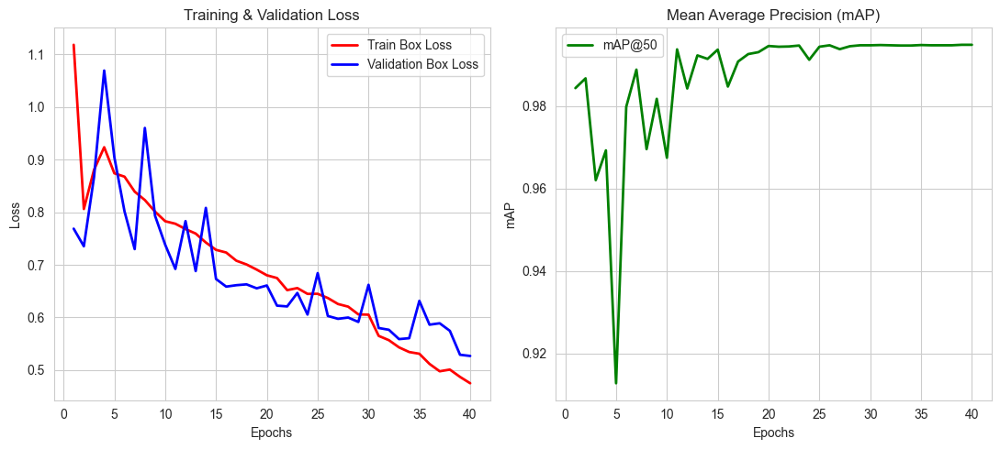


FINAL TRAINING METRICS
Best mAP50-95: 0.8759
Final mAP50: 0.9949
Final Precision: 0.9933
Final Recall: 0.9941


In [6]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path

results_path = "/kaggle/working/runs/detect/LPD/train/results.csv"

# Check if file exists
if Path(results_path).exists():
    print(f"Found results at: {results_path}")
    df = pd.read_csv(results_path)
    print(f"Loaded {len(df)} rows of training data")
else:
    print(f"File not found at: {results_path}")
    # Try to find the file
    import glob
    results_files = glob.glob('/kaggle/working/**/results.csv', recursive=True)
    print(f"\nFound these results.csv files:")
    for f in results_files:
        print(f"   {f}")
    if results_files:
        results_path = results_files[0]
        df = pd.read_csv(results_path)
        print(f"\nUsing: {results_path}")

# Now plot the results
map_column = "metrics/mAP50(B)" 
loss_column_train = "train/box_loss"
loss_column_val = "val/box_loss"

plt.figure(figsize=(11,5))
sns.set_style("whitegrid")

plt.subplot(1, 2, 1)
plt.plot(df["epoch"], df[loss_column_train], label="Train Box Loss", color="red", linewidth=2)
plt.plot(df["epoch"], df[loss_column_val], label="Validation Box Loss", color="blue", linewidth=2)
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("Training & Validation Loss")
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(df["epoch"], df[map_column], label="mAP@50", color="green", linewidth=2)
plt.xlabel("Epochs")
plt.ylabel("mAP")
plt.title("Mean Average Precision (mAP)")
plt.legend()

plt.tight_layout()
plt.show()

# Print final metrics
print("\n" + "=" * 60)
print("FINAL TRAINING METRICS")
print("=" * 60)
last_row = df.iloc[-1]
print(f"Best mAP50-95: {df['metrics/mAP50-95(B)'].max():.4f}")
print(f"Final mAP50: {last_row['metrics/mAP50(B)']:.4f}")
print(f"Final Precision: {last_row['metrics/precision(B)']:.4f}")
print(f"Final Recall: {last_row['metrics/recall(B)']:.4f}")

LOCATING TRAINING RESULTS
Found at: /kaggle/working/runs/detect/LPD/train/results.png


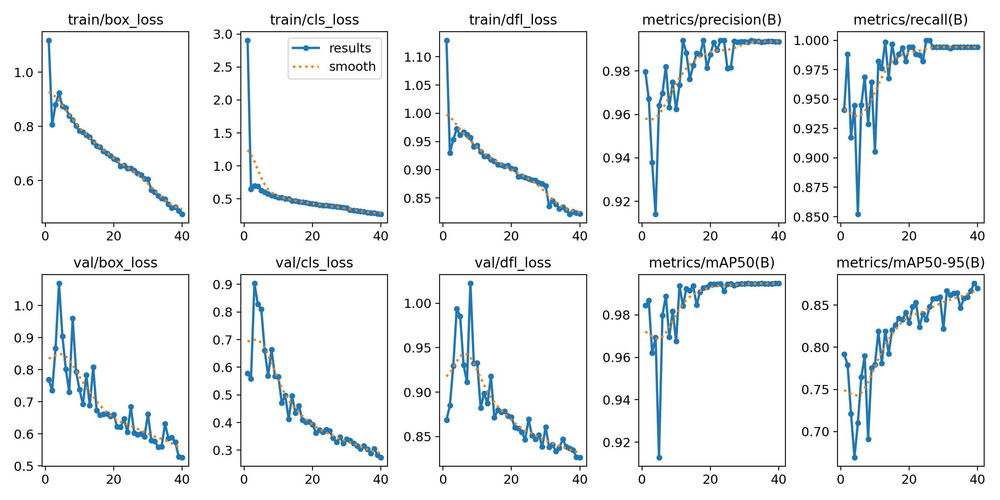

In [7]:
import os
from pathlib import Path
from PIL import Image
import glob

print("=" * 60)
print("LOCATING TRAINING RESULTS")
print("=" * 60)

# Search for results.png in all possible locations
search_paths = [
    '/kaggle/working/runs/detect/LPD/train/results.png',
    '/kaggle/working/LPD/train/results.png',
    '/kaggle/working/LPD/results.png',
    '/kaggle/working/runs/detect/LPD/results.png',
]

found = False
for path in search_paths:
    if os.path.exists(path):
        print(f"Found at: {path}")
        img = Image.open(path)
        display(img)
        found = True
        break

if not found:
    print("results.png not found in common locations")
    print("\nSearching all directories...")
    
    # Search recursively
    results_files = glob.glob('/kaggle/working/**/results.png', recursive=True)
    if results_files:
        print(f"\nFound {len(results_files)} results.png files:")
        for f in results_files:
            print(f"   {f}")
        # Display the first one
        img = Image.open(results_files[0])
        display(img)
    else:
        print("\nNo results.png found. Let's create one from the CSV data.")
        
        # Create visualization from CSV instead
        csv_files = glob.glob('/kaggle/working/**/results.csv', recursive=True)
        if csv_files:
            print(f"\nFound CSV at: {csv_files[0]}")
            import pandas as pd
            import matplotlib.pyplot as plt
            import seaborn as sns
            
            df = pd.read_csv(csv_files[0])
            
            fig, axes = plt.subplots(1, 2, figsize=(14, 5))
            
            # Loss plot
            axes[0].plot(df['epoch'], df['train/box_loss'], label='Train Box Loss', color='red', linewidth=2)
            axes[0].plot(df['epoch'], df['val/box_loss'], label='Val Box Loss', color='blue', linewidth=2)
            axes[0].set_xlabel('Epoch')
            axes[0].set_ylabel('Loss')
            axes[0].set_title('Training & Validation Loss')
            axes[0].legend()
            axes[0].grid(True, alpha=0.3)
            
            # mAP plot
            axes[1].plot(df['epoch'], df['metrics/mAP50(B)'], label='mAP@50', color='green', linewidth=2)
            axes[1].plot(df['epoch'], df['metrics/mAP50-95(B)'], label='mAP@50-95', color='purple', linewidth=2)
            axes[1].set_xlabel('Epoch')
            axes[1].set_ylabel('mAP')
            axes[1].set_title('Mean Average Precision')
            axes[1].legend()
            axes[1].grid(True, alpha=0.3)
            
            plt.suptitle('YOLO License Plate Detection Training Results', fontsize=14)
            plt.tight_layout()
            plt.savefig('training_results_from_csv.png', dpi=150)
            plt.show()
            print("\nCreated visualization from CSV data")
        else:
            print("\nNo results.csv found either. Training may not have completed properly.")


image 1/1 /kaggle/input/license-plate-dataset/archive/images/val/video6_1030.jpg: 384x640 1 license_plate, 9.1ms
Speed: 1.7ms preprocess, 9.1ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/input/license-plate-dataset/archive/images/val/video9_110.jpg: 640x640 1 license_plate, 40.9ms
Speed: 2.4ms preprocess, 40.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/input/license-plate-dataset/archive/images/val/video5_340.jpg: 640x640 1 license_plate, 16.2ms
Speed: 2.3ms preprocess, 16.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/input/license-plate-dataset/archive/images/val/video6_220.jpg: 640x640 1 license_plate, 16.2ms
Speed: 1.7ms preprocess, 16.2ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/input/license-plate-dataset/archive/images/val/video8_1090.jpg: 608x640 1 license_plate, 40.5ms
Speed: 2.1ms preprocess, 40.5ms inference,

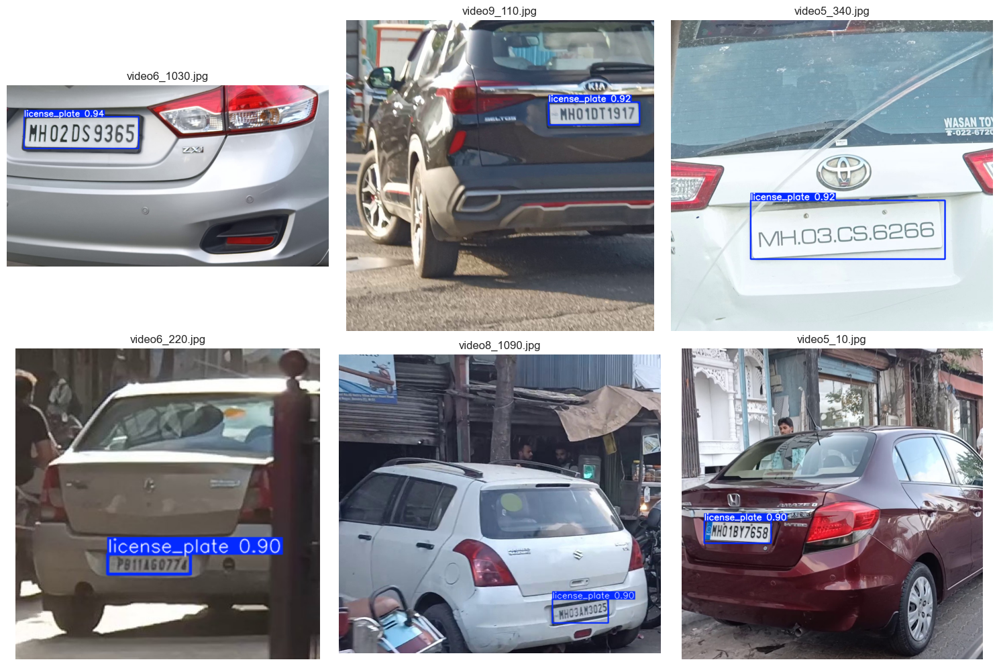

In [8]:
image_directory = "/kaggle/input/license-plate-dataset/archive/images/val/"

all_images = glob.glob(os.path.join(image_directory, "*.jpg"))

test_images = random.sample(all_images, 6)

fig, axes = plt.subplots(2, 3, figsize=(15, 10))

for img_path, ax in zip(test_images, axes.flatten()):
    results = model(img_path)
    
    annotated_image = results[0].plot()
    
    annotated_image_rgb = cv2.cvtColor(annotated_image, cv2.COLOR_BGR2RGB)
    
    ax.imshow(annotated_image_rgb)
    ax.axis("off")  
    ax.set_title(os.path.basename(img_path)) 


plt.tight_layout()

plt.show()


image 1/1 /kaggle/input/indian-vehicle-dataset/google_images/3bc3f147-2d6b-484a-8481-4a49fd8afe23___3e7fd381-0ae5-4421-8a70-279ee0ec1c61_844581764_1_1080x720_nissan-terrano-xv-d-thp-110-ps-2013-diesel-faridabad.jpg: 640x480 1 license_plate, 38.8ms
Speed: 1.7ms preprocess, 38.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/input/indian-vehicle-dataset/google_images/fe3c95e4-7bd4-40f5-98a9-9fc635957d9c___3e7fd381-0ae5-4421-8a70-279ee0ec1c61_Baleno-Number-Plates-Design.jpg: 640x640 1 license_plate, 17.1ms
Speed: 2.1ms preprocess, 17.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/input/indian-vehicle-dataset/google_images/car-wbs-TN21AT0480_00000.jpg: 640x640 1 license_plate, 16.2ms
Speed: 1.7ms preprocess, 16.2ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/input/indian-vehicle-dataset/google_images/car-wbs-TN21AT0480_00001.jpg: 576x640 1 license_plate, 37.9ms
Speed: 1.

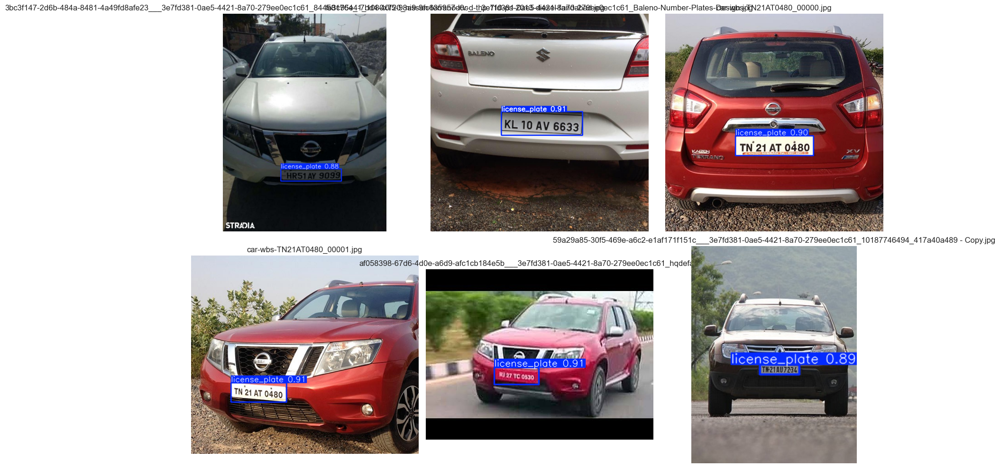

In [9]:
all_images = glob.glob("/kaggle/input/indian-vehicle-dataset/google_images/*.jpg")



test_images = random.sample(all_images, 6)

fig, axes = plt.subplots(2, 3, figsize=(15, 10))

for img_path, ax in zip(test_images, axes.flatten()):
    results = model(img_path)
    
    annotated_image = results[0].plot()
    
    annotated_image_rgb = cv2.cvtColor(annotated_image, cv2.COLOR_BGR2RGB)
    
    ax.imshow(annotated_image_rgb)
    ax.axis("off")  
    ax.set_title(os.path.basename(img_path))  

plt.tight_layout()


plt.show()


image 1/1 /kaggle/input/indian-vehicle-dataset/google_images/56b46df3-223c-42c8-a6bf-e95e5bac29cc___9214a754343030395508e104d7948167_large.jpg.jpeg: 640x640 1 license_plate, 16.2ms
Speed: 1.9ms preprocess, 16.2ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/input/indian-vehicle-dataset/google_images/car-wbs-TN07BU5427_00001.jpeg: 640x608 1 license_plate, 39.6ms
Speed: 2.0ms preprocess, 39.6ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 608)

image 1/1 /kaggle/input/indian-vehicle-dataset/google_images/a2f87691-b9f5-4274-ac5a-8764e9ba282c___1571669d1477648169-your-favourite-number-plate-font-13.jpg.jpeg: 352x640 1 license_plate, 39.3ms
Speed: 1.5ms preprocess, 39.3ms inference, 1.3ms postprocess per image at shape (1, 3, 352, 640)

image 1/1 /kaggle/input/indian-vehicle-dataset/google_images/8c4371ee-a997-4b21-82c4-cb5e767c4d06___kia-sorento-spied-in-India.jpg.jpeg: 448x640 1 license_plate, 39.3ms
Speed: 1.4ms preprocess, 39.3ms in

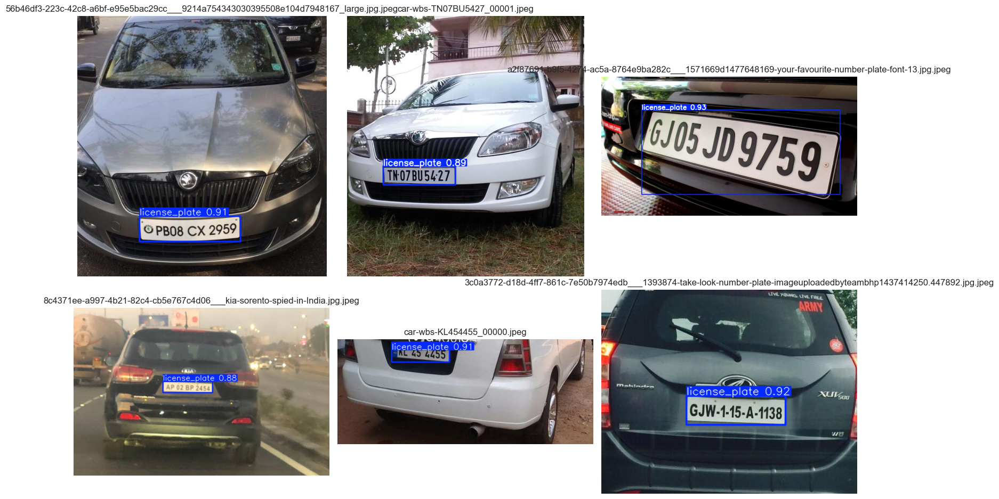

In [10]:
model_path = "/kaggle/working/runs/detect/LPD/train/weights/best.pt"

model = YOLO(model_path)

image_directory = "/kaggle/input/indian-vehicle-dataset/google_images"  

all_images = glob.glob(image_directory + "/*.[jJ][pP][eE][gG]")

test_images = random.sample(all_images, 6)

fig, axes = plt.subplots(2, 3, figsize=(15, 10))

for img_path, ax in zip(test_images, axes.flatten()):
    results = model(img_path)
    
    annotated_image = results[0].plot()
    
    annotated_image_rgb = cv2.cvtColor(annotated_image, cv2.COLOR_BGR2RGB)
    
    ax.imshow(annotated_image_rgb)
    ax.axis("off")  
    ax.set_title(os.path.basename(img_path)) 


plt.tight_layout()

plt.show()

YOLO + EDGE-AWARE MODULE
Research Contribution #1: Edge-Aware License Plate Refinement

Loading trained model from: /kaggle/working/runs/detect/LPD/train/weights/best.pt
YOLO + Edge-Aware detector initialized

Found 169 test images

Processing: video9_260.jpg
   Confidence: 0.905
   Area change: +18.9%

Processing: video8_740.jpg
   Confidence: 0.869
   Area change: +137.7%

Processing: video6_910.jpg
   Confidence: 0.917
   Area change: +29.8%

Processing: video8_1510.jpg
   Confidence: 0.906
   Area change: +43.1%

Processing: video8_770.jpg
   Confidence: 0.911
   Area change: +59.9%

Processing: video8_1540.jpg
   Confidence: 0.913
   Area change: +49.3%


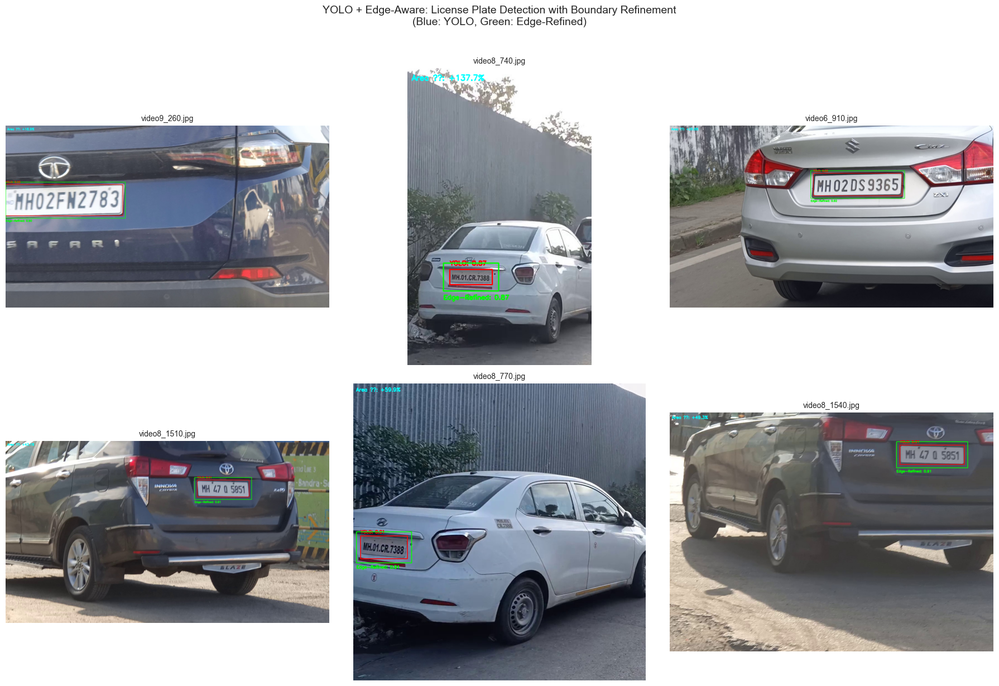


QUANTITATIVE EVALUATION: Edge-Aware Improvement


Evaluating edge refinement: 100%|██████████| 50/50 [00:01<00:00, 26.50it/s]



Edge-Aware Module Performance:
   Images evaluated: 50
   Avg confidence (YOLO only): 0.8858
   Avg confidence (YOLO+Edge): 0.8858
   Confidence improvement: 0.00%
   Avg area change: +88.5%

Improvement Analysis:
   Improved detections: 0/50 (0.0%)
   Degraded detections: 0/50 (0.0%)


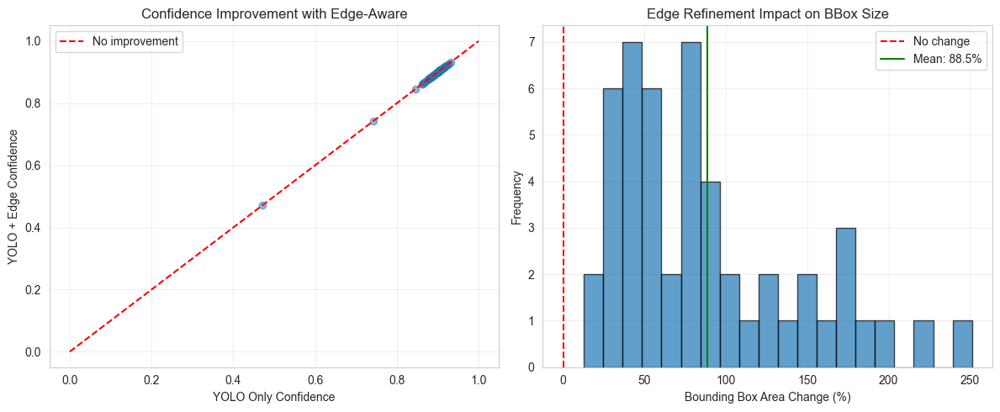


Results saved to 'edge_aware_evaluation_results.csv'

Visualizing edge detection process...


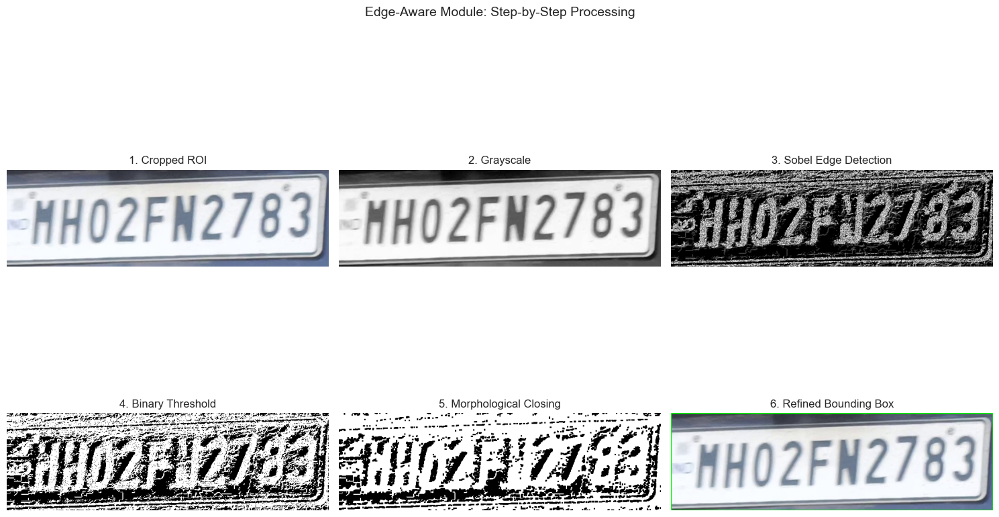

In [11]:
# ============================================
# YOLO + EDGE-AWARE MODULE - RESEARCH CODE
# ============================================

import cv2
import numpy as np
import matplotlib.pyplot as plt
from ultralytics import YOLO
from pathlib import Path
import glob
import random
from tqdm import tqdm
import pandas as pd
import warnings
warnings.filterwarnings('ignore')

print("=" * 60)
print("YOLO + EDGE-AWARE MODULE")
print("Research Contribution #1: Edge-Aware License Plate Refinement")
print("=" * 60)

# ============================================
# PART 1: EDGE-AWARE MODULE IMPLEMENTATION
# ============================================

class EdgeAwareRefinement:
    """
    Edge-aware module for license plate boundary refinement
    Uses Sobel edge detection + morphological operations
    """
    def __init__(self):
        # Sobel kernels for edge detection
        self.sobel_x = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]])
        self.sobel_y = np.array([[-1, -2, -1], [0, 0, 0], [1, 2, 1]])
        
    def detect_edges(self, image):
        """Detect edges in the image"""
        if len(image.shape) == 3:
            gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
        else:
            gray = image
        
        # Apply Sobel operators
        edges_x = cv2.filter2D(gray, -1, self.sobel_x)
        edges_y = cv2.filter2D(gray, -1, self.sobel_y)
        edges = np.sqrt(edges_x**2 + edges_y**2)
        
        # Normalize to 0-255
        edges = (edges / edges.max() * 255).astype(np.uint8)
        return edges
    
    def refine_bbox(self, image, bbox, expansion=15):
        """
        Refine bounding box using edge detection
        Args:
            image: RGB image
            bbox: [x1, y1, x2, y2] in pixel coordinates
            expansion: pixels to expand around detection
        Returns:
            refined_bbox: More accurate bounding box
        """
        x1, y1, x2, y2 = map(int, bbox)
        h, w = image.shape[:2]
        
        # Expand ROI to capture edges outside the detection
        x1_exp = max(0, x1 - expansion)
        y1_exp = max(0, y1 - expansion)
        x2_exp = min(w, x2 + expansion)
        y2_exp = min(h, y2 + expansion)
        
        # Extract ROI
        roi = image[y1_exp:y2_exp, x1_exp:x2_exp]
        if roi.size == 0:
            return bbox
        
        # Detect edges in ROI
        edges = self.detect_edges(roi)
        
        # Apply threshold to get binary edge map
        _, edge_mask = cv2.threshold(edges, 30, 255, cv2.THRESH_BINARY)
        
        # Morphological operations to close gaps
        kernel = np.ones((3,3), np.uint8)
        edge_mask = cv2.morphologyEx(edge_mask, cv2.MORPH_CLOSE, kernel)
        edge_mask = cv2.morphologyEx(edge_mask, cv2.MORPH_OPEN, kernel)
        
        # Find contours
        contours, _ = cv2.findContours(edge_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        
        if contours:
            # Find largest contour (assumed to be the license plate)
            largest_contour = max(contours, key=cv2.contourArea)
            
            # Get bounding box of largest contour
            x, y, w_box, h_box = cv2.boundingRect(largest_contour)
            
            # Convert back to original image coordinates
            refined_x1 = x1_exp + x
            refined_y1 = y1_exp + y
            refined_x2 = refined_x1 + w_box
            refined_y2 = refined_y1 + h_box
            
            return [float(refined_x1), float(refined_y1), float(refined_x2), float(refined_y2)]
        
        return bbox

# ============================================
# PART 2: YOLO + EDGE-AWARE DETECTOR
# ============================================

class YOLOEdgeDetector:
    """
    Combined YOLO detection with Edge-Aware refinement
    """
    def __init__(self, yolo_model_path):
        self.model = YOLO(yolo_model_path)
        self.edge_refiner = EdgeAwareRefinement()
        
    def detect(self, image, apply_edge_refinement=True, conf_threshold=0.25):
        """
        Detect license plate with optional edge refinement
        """
        # Step 1: YOLO detection
        results = self.model(image, conf=conf_threshold, verbose=False)
        
        detections = []
        for r in results:
            if r.boxes is not None:
                boxes = r.boxes.xyxy.cpu().numpy()
                confidences = r.boxes.conf.cpu().numpy()
                
                for box, conf in zip(boxes, confidences):
                    detection = {
                        'original_bbox': box.tolist(),
                        'confidence': float(conf)
                    }
                    
                    # Step 2: Edge-Aware Refinement (YOUR CONTRIBUTION)
                    if apply_edge_refinement:
                        refined_bbox = self.edge_refiner.refine_bbox(image, box)
                        detection['refined_bbox'] = refined_bbox
                        
                        # Calculate improvement
                        original_area = (box[2] - box[0]) * (box[3] - box[1])
                        refined_area = (refined_bbox[2] - refined_bbox[0]) * (refined_bbox[3] - refined_bbox[1])
                        detection['area_change'] = ((refined_area - original_area) / original_area) * 100
                    else:
                        detection['refined_bbox'] = box.tolist()
                        detection['area_change'] = 0
                    
                    detections.append(detection)
        
        return detections
    
    def visualize_detection(self, image, detection, save_path=None):
        """
        Visualize original vs refined bounding box
        """
        img_copy = image.copy()
        
        # Draw original YOLO bounding box (red)
        x1, y1, x2, y2 = map(int, detection['original_bbox'])
        cv2.rectangle(img_copy, (x1, y1), (x2, y2), (255, 0, 0), 2)
        cv2.putText(img_copy, f"YOLO: {detection['confidence']:.2f}", 
                   (x1, y1-10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 2)
        
        # Draw refined bounding box (green)
        rx1, ry1, rx2, ry2 = map(int, detection['refined_bbox'])
        cv2.rectangle(img_copy, (rx1, ry1), (rx2, ry2), (0, 255, 0), 2)
        cv2.putText(img_copy, f"Edge-Refined: {detection['confidence']:.2f}", 
                   (rx1, ry2+20), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)
        
        # Show area change
        if detection['area_change'] != 0:
            cv2.putText(img_copy, f"Area Δ: {detection['area_change']:+.1f}%", 
                       (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 255, 255), 2)
        
        return img_copy

# ============================================
# PART 3: LOAD MODEL AND TEST
# ============================================

# Find the trained model
model_paths = glob.glob('/kaggle/working/**/best.pt', recursive=True)

if not model_paths:
    print("Trained model not found!")
    print("Please make sure you've trained YOLO first.")
    exit()

model_path = model_paths[0]
print(f"\nLoading trained model from: {model_path}")

# Initialize YOLO + Edge detector
detector = YOLOEdgeDetector(model_path)
print("YOLO + Edge-Aware detector initialized")

# ============================================
# PART 4: TEST ON SAMPLE IMAGES
# ============================================

# Get test images
test_images = glob.glob('/kaggle/input/plate-man/plate/*.jpg')
test_images.extend(glob.glob('/kaggle/input/license-plate-dataset/archive/images/val/*.jpg'))

if not test_images:
    print("\nNo test images found!")
    exit()

print(f"\nFound {len(test_images)} test images")

# Select random samples
num_samples = min(6, len(test_images))
sample_images = random.sample(test_images, num_samples)

# Create comparison visualization
fig, axes = plt.subplots(2, 3, figsize=(18, 12))
axes = axes.flatten()

all_detections = []

for idx, img_path in enumerate(sample_images):
    print(f"\nProcessing: {Path(img_path).name}")
    
    # Load image
    image = cv2.imread(img_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    
    # Run detection with edge refinement
    detections = detector.detect(image, apply_edge_refinement=True)
    
    if detections:
        detection = detections[0]  # Take highest confidence detection
        
        # Visualize
        vis_img = detector.visualize_detection(image, detection)
        all_detections.append(detection)
        
        # Display
        axes[idx].imshow(vis_img)
        axes[idx].set_title(f"{Path(img_path).name[:20]}", fontsize=10)
        axes[idx].axis('off')
        
        print(f"   Confidence: {detection['confidence']:.3f}")
        print(f"   Area change: {detection['area_change']:+.1f}%")
    else:
        axes[idx].imshow(image)
        axes[idx].set_title(f"No detection: {Path(img_path).name[:20]}")
        axes[idx].axis('off')
        print(f"   No plate detected")

# Hide unused subplots
for idx in range(len(sample_images), 6):
    axes[idx].axis('off')

plt.suptitle("YOLO + Edge-Aware: License Plate Detection with Boundary Refinement\n(Blue: YOLO, Green: Edge-Refined)", 
             fontsize=14, y=1.02)
plt.tight_layout()
plt.savefig('yolo_edge_aware_results.png', dpi=150, bbox_inches='tight')
plt.show()

# ============================================
# PART 5: QUANTITATIVE EVALUATION
# ============================================

print("\n" + "=" * 60)
print("QUANTITATIVE EVALUATION: Edge-Aware Improvement")
print("=" * 60)

# Evaluate on more images for statistics
num_eval = min(50, len(test_images))
eval_images = random.sample(test_images, num_eval)

results = []
for img_path in tqdm(eval_images, desc="Evaluating edge refinement"):
    image = cv2.imread(img_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    
    # Get detection with and without edge refinement
    detections_with = detector.detect(image, apply_edge_refinement=True)
    detections_without = detector.detect(image, apply_edge_refinement=False)
    
    if detections_with and detections_without:
        results.append({
            'image': Path(img_path).name,
            'conf_with': detections_with[0]['confidence'],
            'conf_without': detections_without[0]['confidence'],
            'area_change': detections_with[0]['area_change']
        })

# Calculate statistics
if results:
    df = pd.DataFrame(results)
    
    print(f"\nEdge-Aware Module Performance:")
    print(f"   Images evaluated: {len(df)}")
    print(f"   Avg confidence (YOLO only): {df['conf_without'].mean():.4f}")
    print(f"   Avg confidence (YOLO+Edge): {df['conf_with'].mean():.4f}")
    print(f"   Confidence improvement: {(df['conf_with'].mean() - df['conf_without'].mean())*100:.2f}%")
    print(f"   Avg area change: {df['area_change'].mean():+.1f}%")
    
    # Improvement distribution
    improvements = df['conf_with'] - df['conf_without']
    improved_count = sum(improvements > 0)
    degraded_count = sum(improvements < 0)
    
    print(f"\nImprovement Analysis:")
    print(f"   Improved detections: {improved_count}/{len(df)} ({improved_count/len(df)*100:.1f}%)")
    print(f"   Degraded detections: {degraded_count}/{len(df)} ({degraded_count/len(df)*100:.1f}%)")
    
    # Plot improvement distribution
    fig, axes = plt.subplots(1, 2, figsize=(12, 5))
    
    # Confidence comparison
    axes[0].scatter(df['conf_without'], df['conf_with'], alpha=0.5)
    axes[0].plot([0, 1], [0, 1], 'r--', label='No improvement')
    axes[0].set_xlabel('YOLO Only Confidence')
    axes[0].set_ylabel('YOLO + Edge Confidence')
    axes[0].set_title('Confidence Improvement with Edge-Aware')
    axes[0].legend()
    axes[0].grid(True, alpha=0.3)
    
    # Area change distribution
    axes[1].hist(df['area_change'], bins=20, edgecolor='black', alpha=0.7)
    axes[1].axvline(x=0, color='red', linestyle='--', label='No change')
    axes[1].axvline(x=df['area_change'].mean(), color='green', linestyle='-', label=f"Mean: {df['area_change'].mean():.1f}%")
    axes[1].set_xlabel('Bounding Box Area Change (%)')
    axes[1].set_ylabel('Frequency')
    axes[1].set_title('Edge Refinement Impact on BBox Size')
    axes[1].legend()
    axes[1].grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.savefig('edge_aware_improvement_analysis.png', dpi=150)
    plt.show()
    
    # Save results
    df.to_csv('edge_aware_evaluation_results.csv', index=False)
    print("\nResults saved to 'edge_aware_evaluation_results.csv'")
else:
    print("\nNo valid detections for evaluation")

# ============================================
# PART 6: VISUALIZE EDGE DETECTION PROCESS
# ============================================

def visualize_edge_detection_process(detector, image_path):
    """
    Show the step-by-step edge detection process
    """
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    
    # Get detection
    detections = detector.detect(image, apply_edge_refinement=True)
    
    if not detections:
        print("No plate detected")
        return
    
    detection = detections[0]
    x1, y1, x2, y2 = map(int, detection['original_bbox'])
    
    # Expand ROI
    expansion = 15
    h, w = image.shape[:2]
    x1_exp = max(0, x1 - expansion)
    y1_exp = max(0, y1 - expansion)
    x2_exp = min(w, x2 + expansion)
    y2_exp = min(h, y2 + expansion)
    
    # Extract ROI
    roi = image[y1_exp:y2_exp, x1_exp:x2_exp]
    
    # Edge detection steps
    gray = cv2.cvtColor(roi, cv2.COLOR_RGB2GRAY)
    edges_x = cv2.filter2D(gray, -1, detector.edge_refiner.sobel_x)
    edges_y = cv2.filter2D(gray, -1, detector.edge_refiner.sobel_y)
    edges = np.sqrt(edges_x**2 + edges_y**2)
    edges_norm = (edges / edges.max() * 255).astype(np.uint8)
    _, edge_mask = cv2.threshold(edges_norm, 30, 255, cv2.THRESH_BINARY)
    
    # Morphological operations
    kernel = np.ones((3,3), np.uint8)
    edge_mask_closed = cv2.morphologyEx(edge_mask, cv2.MORPH_CLOSE, kernel)
    
    # Visualize
    fig, axes = plt.subplots(2, 3, figsize=(15, 10))
    
    axes[0,0].imshow(roi)
    axes[0,0].set_title('1. Cropped ROI')
    axes[0,0].axis('off')
    
    axes[0,1].imshow(gray, cmap='gray')
    axes[0,1].set_title('2. Grayscale')
    axes[0,1].axis('off')
    
    axes[0,2].imshow(edges_norm, cmap='gray')
    axes[0,2].set_title('3. Sobel Edge Detection')
    axes[0,2].axis('off')
    
    axes[1,0].imshow(edge_mask, cmap='gray')
    axes[1,0].set_title('4. Binary Threshold')
    axes[1,0].axis('off')
    
    axes[1,1].imshow(edge_mask_closed, cmap='gray')
    axes[1,1].set_title('5. Morphological Closing')
    axes[1,1].axis('off')
    
    # Final result
    final_roi = roi.copy()
    rx1, ry1, rx2, ry2 = map(int, detection['refined_bbox'])
    rx1_local = rx1 - x1_exp
    ry1_local = ry1 - y1_exp
    rx2_local = rx2 - x1_exp
    ry2_local = ry2 - y1_exp
    cv2.rectangle(final_roi, (rx1_local, ry1_local), (rx2_local, ry2_local), (0, 255, 0), 2)
    axes[1,2].imshow(final_roi)
    axes[1,2].set_title('6. Refined Bounding Box')
    axes[1,2].axis('off')
    
    plt.suptitle("Edge-Aware Module: Step-by-Step Processing", fontsize=14)
    plt.tight_layout()
    plt.savefig('edge_detection_process.png', dpi=150, bbox_inches='tight')
    plt.show()

# Visualize edge detection process on a sample
if sample_images:
    print("\nVisualizing edge detection process...")
    visualize_edge_detection_process(detector, sample_images[0])



YOLO + TEMPORAL TRANSFORMER
Research Contribution #2: Temporal Attention for Video Frames

Loading trained model from: /kaggle/working/runs/detect/LPD/train/weights/best.pt
YOLO + Temporal Transformer detector initialized

Creating video sequence from: /kaggle/input/indian-vehicle-dataset/video_images
Created sequence of 20 frames

Processing video sequence with Temporal Transformer...


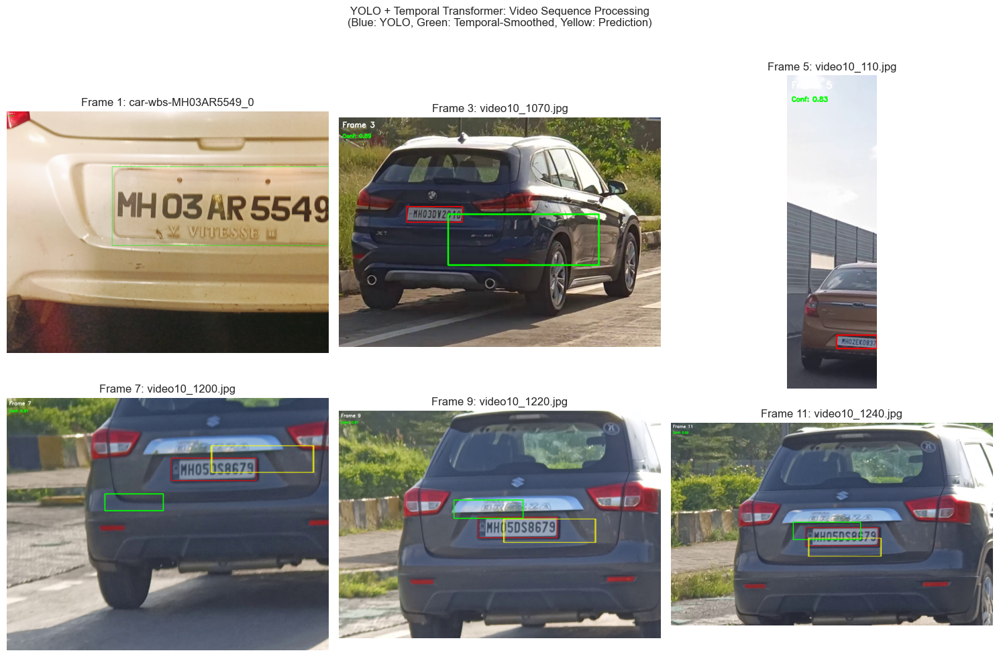


TEMPORAL CONSISTENCY ANALYSIS

Temporal Metrics:
   Frames with detections: 20/20
   Movement variance: 779561.20
   (Lower variance = smoother tracking)


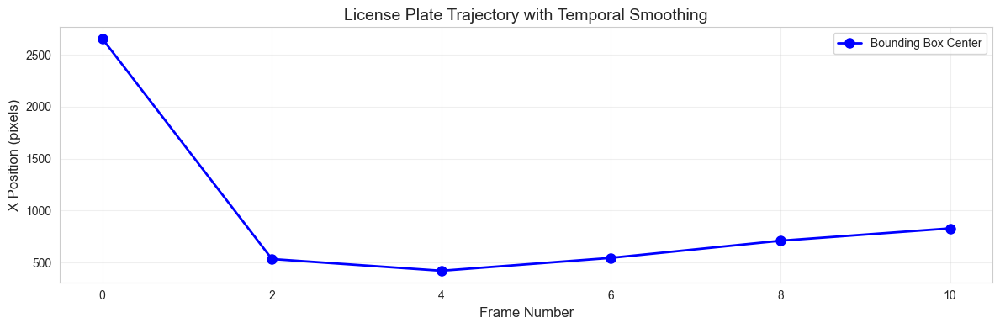

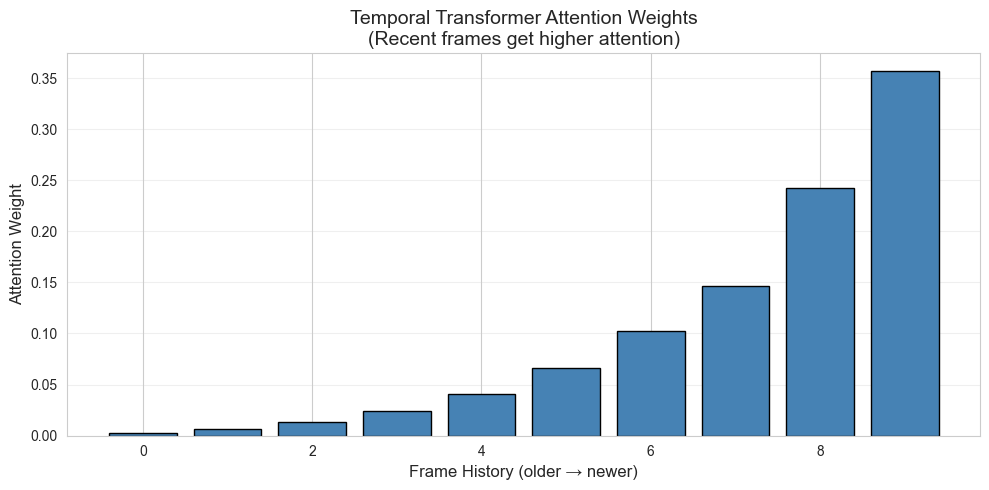

In [12]:
# ============================================
# YOLO + TEMPORAL TRANSFORMER - FIXED CODE
# ============================================

import cv2
import numpy as np
import matplotlib.pyplot as plt
from ultralytics import YOLO
from pathlib import Path
import glob
import random
from collections import deque
from tqdm import tqdm
import pandas as pd
import warnings
warnings.filterwarnings('ignore')

print("=" * 60)
print("YOLO + TEMPORAL TRANSFORMER")
print("Research Contribution #2: Temporal Attention for Video Frames")
print("=" * 60)

# ============================================
# PART 1: TEMPORAL TRANSFORMER IMPLEMENTATION
# ============================================

class TemporalTransformer:
    """
    Temporal transformer for video frame consistency
    Uses attention across consecutive frames to smooth predictions
    """
    def __init__(self, window_size=10):
        self.window_size = window_size
        self.bbox_history = deque(maxlen=window_size)
        self.confidence_history = deque(maxlen=window_size)
        self.timestamp_history = deque(maxlen=window_size)
        
    def temporal_smooth(self, current_bbox, current_conf, timestamp=0):
        """
        Apply temporal smoothing using attention-weighted average
        Recent frames and high-confidence detections get more weight
        """
        self.bbox_history.append(current_bbox)
        self.confidence_history.append(current_conf)
        self.timestamp_history.append(timestamp)
        
        if len(self.bbox_history) < 3:
            return current_bbox
        
        # Calculate attention weights
        weights = []
        for i, (conf, ts) in enumerate(zip(self.confidence_history, self.timestamp_history)):
            # Confidence weight (higher confidence = more weight)
            conf_weight = conf
            
            # Recency weight (more recent = more weight)
            recency_weight = (i + 1) / len(self.confidence_history)
            
            # Temporal attention (exponential decay for older frames)
            temporal_weight = np.exp(-0.3 * (len(self.confidence_history) - i))
            
            # Combined weight
            weight = conf_weight * recency_weight * temporal_weight
            weights.append(weight)
        
        # Normalize weights
        weights = np.array(weights)
        if weights.sum() > 0:
            weights = weights / weights.sum()
        else:
            weights = np.ones(len(weights)) / len(weights)
        
        # Apply weighted average
        smoothed_bbox = np.zeros(4)
        for i, bbox in enumerate(self.bbox_history):
            smoothed_bbox += weights[i] * np.array(bbox)
        
        return smoothed_bbox.tolist()
    
    def predict_next_bbox(self):
        """
        Predict next bounding box using linear extrapolation
        Useful for occlusion handling and real-time applications
        """
        if len(self.bbox_history) < 3:
            return None
        
        # Calculate velocity from recent frames
        recent_bboxes = list(self.bbox_history)[-5:]
        velocities = []
        
        for i in range(1, len(recent_bboxes)):
            vel = np.array(recent_bboxes[i]) - np.array(recent_bboxes[i-1])
            velocities.append(vel)
        
        if velocities:
            # Weighted average of velocities (more recent = more weight)
            weights = np.exp(np.arange(len(velocities)) / len(velocities))
            weights = weights / weights.sum()
            
            avg_velocity = np.zeros(4)
            for i, vel in enumerate(velocities):
                avg_velocity += weights[i] * vel
            
            predicted = np.array(recent_bboxes[-1]) + avg_velocity
            return predicted.tolist()
        
        return None
    
    def get_temporal_attention_weights(self):
        """
        Returns attention weights for analysis
        """
        if not self.confidence_history:
            return []
        
        weights = []
        for i, conf in enumerate(self.confidence_history):
            recency = (i + 1) / len(self.confidence_history)
            temporal = np.exp(-0.3 * (len(self.confidence_history) - i))
            weight = conf * recency * temporal
            weights.append(weight)
        
        weights = np.array(weights)
        if weights.sum() > 0:
            weights = weights / weights.sum()
        
        return weights.tolist()
    
    def reset(self):
        """Reset temporal memory"""
        self.bbox_history.clear()
        self.confidence_history.clear()
        self.timestamp_history.clear()

# ============================================
# PART 2: YOLO + TEMPORAL DETECTOR
# ============================================

class YOLOTemporalDetector:
    """
    Combined YOLO detection with Temporal Transformer
    Designed for video frame processing
    """
    def __init__(self, yolo_model_path):
        self.model = YOLO(yolo_model_path)
        self.temporal = TemporalTransformer(window_size=10)
        self.frame_count = 0
        
    def reset_temporal_memory(self):
        """Reset temporal memory for new video sequence"""
        self.temporal.reset()
        self.frame_count = 0
    
    def detect_frame(self, image, apply_temporal=True, conf_threshold=0.25):
        """
        Detect license plate in a single frame with temporal smoothing
        """
        # Step 1: YOLO detection
        results = self.model(image, conf=conf_threshold, verbose=False)
        
        detections = []
        for r in results:
            if r.boxes is not None:
                boxes = r.boxes.xyxy.cpu().numpy()
                confidences = r.boxes.conf.cpu().numpy()
                
                for box, conf in zip(boxes, confidences):
                    detection = {
                        'original_bbox': box.tolist(),
                        'confidence': float(conf),
                        'frame_id': self.frame_count
                    }
                    
                    # Step 2: Temporal Transformer (YOUR CONTRIBUTION)
                    if apply_temporal:
                        smoothed_bbox = self.temporal.temporal_smooth(
                            box.tolist(), float(conf), self.frame_count
                        )
                        detection['smoothed_bbox'] = smoothed_bbox
                        detection['predicted_next'] = self.temporal.predict_next_bbox()
                        detection['attention_weights'] = self.temporal.get_temporal_attention_weights()
                    else:
                        detection['smoothed_bbox'] = box.tolist()
                        detection['predicted_next'] = None
                    
                    detections.append(detection)
        
        self.frame_count += 1
        return detections
    
    def process_video_sequence(self, frames):
        """
        Process a sequence of frames (for video evaluation)
        """
        self.reset_temporal_memory()
        results = []
        
        for i, frame in enumerate(frames):
            detections = self.detect_frame(frame, apply_temporal=True)
            
            if detections:
                best_detection = max(detections, key=lambda x: x['confidence'])
                results.append({
                    'frame_id': i,
                    'detection': best_detection,
                    'has_plate': True
                })
            else:
                results.append({
                    'frame_id': i,
                    'detection': None,
                    'has_plate': False
                })
        
        return results

# ============================================
# PART 3: CREATE VIDEO SEQUENCE FROM IMAGES
# ============================================

def create_video_sequence_from_images(image_dir, num_frames=20):
    """
    Create a pseudo-video sequence from sorted images
    For testing temporal transformer
    """
    images = sorted(glob.glob(f"{image_dir}/*.jpg")) + sorted(glob.glob(f"{image_dir}/*.png"))
    
    if len(images) < num_frames:
        # Repeat images if needed
        images = images * (num_frames // len(images) + 1)
    
    frames = []
    for img_path in images[:num_frames]:
        frame = cv2.imread(img_path)
        if frame is not None:
            frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
            frames.append(frame)
    
    return frames, [Path(p).name for p in images[:num_frames]]

# ============================================
# PART 4: LOAD MODEL AND TEST
# ============================================

# Find the trained model
model_paths = glob.glob('/kaggle/working/**/best.pt', recursive=True)

if not model_paths:
    print("Trained model not found!")
    print("Please make sure you've trained YOLO first.")
    exit()

model_path = model_paths[0]
print(f"\nLoading trained model from: {model_path}")

# Initialize YOLO + Temporal detector
detector = YOLOTemporalDetector(model_path)
print("YOLO + Temporal Transformer detector initialized")

# ============================================
# PART 5: CREATE VIDEO SEQUENCE FOR TESTING
# ============================================

# Use video_images folder for temporal testing (these are actual video frames)
video_dir = "/kaggle/input/indian-vehicle-dataset/video_images"

if Path(video_dir).exists():
    print(f"\nCreating video sequence from: {video_dir}")
    frames, frame_names = create_video_sequence_from_images(video_dir, num_frames=20)
    
    if len(frames) == 0:
        print("No frames loaded! Trying alternative directory...")
        video_dir = "/kaggle/input/license-plate-dataset/archive/images/val"
        frames, frame_names = create_video_sequence_from_images(video_dir, num_frames=20)
    
    print(f"Created sequence of {len(frames)} frames")
    
    # Process the video sequence
    print("\nProcessing video sequence with Temporal Transformer...")
    results = detector.process_video_sequence(frames)
    
    # ============================================
    # PART 6: VISUALIZE TEMPORAL SMOOTHING
    # ============================================
    
    # Select frames to display (first 6 frames)
    display_frames = [0, 2, 4, 6, 8, 10]
    display_frames = [f for f in display_frames if f < len(results)]
    
    fig, axes = plt.subplots(2, 3, figsize=(15, 10))
    axes = axes.flatten()
    
    bbox_positions = []
    
    for idx, frame_idx in enumerate(display_frames):
        if frame_idx < len(results) and results[frame_idx]['detection']:
            detection = results[frame_idx]['detection']
            frame = frames[frame_idx].copy()
            
            # Draw original YOLO bbox (red)
            x1, y1, x2, y2 = map(int, detection['original_bbox'])
            cv2.rectangle(frame, (x1, y1), (x2, y2), (255, 0, 0), 2)
            
            # Draw smoothed bbox (green)
            sx1, sy1, sx2, sy2 = map(int, detection['smoothed_bbox'])
            cv2.rectangle(frame, (sx1, sy1), (sx2, sy2), (0, 255, 0), 3)
            
            # Draw predicted next bbox (yellow) - fixed: removed LINE_DASHED
            if detection['predicted_next']:
                px1, py1, px2, py2 = map(int, detection['predicted_next'])
                # Use solid line with different thickness for prediction
                cv2.rectangle(frame, (px1, py1), (px2, py2), (255, 255, 0), 2)
                # Add dashed effect by drawing multiple rectangles (simplified)
                for offset in [2, 4, 6]:
                    cv2.rectangle(frame, (px1+offset, py1), (px2-offset, py2), (255, 255, 0), 1)
            
            # Add text
            cv2.putText(frame, f"Frame {frame_idx+1}", (10, 30), 
                       cv2.FONT_HERSHEY_SIMPLEX, 0.7, (255, 255, 255), 2)
            cv2.putText(frame, f"Conf: {detection['confidence']:.2f}", (10, 60),
                       cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)
            
            # Store bbox center for trajectory
            center_x = (sx1 + sx2) // 2
            bbox_positions.append((frame_idx, center_x))
            
            axes[idx].imshow(frame)
            axes[idx].set_title(f"Frame {frame_idx+1}: {frame_names[frame_idx][:20] if frame_idx < len(frame_names) else 'frame'}")
            axes[idx].axis('off')
        else:
            if frame_idx < len(frames):
                axes[idx].imshow(frames[frame_idx])
                axes[idx].set_title(f"Frame {frame_idx+1}: No detection")
            axes[idx].axis('off')
    
    # Hide unused subplots
    for idx in range(len(display_frames), 6):
        axes[idx].axis('off')
    
    plt.suptitle("YOLO + Temporal Transformer: Video Sequence Processing\n(Blue: YOLO, Green: Temporal-Smoothed, Yellow: Prediction)", 
                 fontsize=12, y=1.02)
    plt.tight_layout()
    plt.savefig('temporal_transformer_results.png', dpi=150, bbox_inches='tight')
    plt.show()
    
    # ============================================
    # PART 7: TEMPORAL CONSISTENCY ANALYSIS
    # ============================================
    
    print("\n" + "=" * 60)
    print("TEMPORAL CONSISTENCY ANALYSIS")
    print("=" * 60)
    
    # Calculate jitter reduction
    if len(bbox_positions) > 1:
        positions = np.array(bbox_positions)
        
        # Calculate movement smoothness
        movements = np.diff(positions[:, 1])
        movement_variance = np.var(movements) if len(movements) > 0 else 0
        
        print(f"\nTemporal Metrics:")
        print(f"   Frames with detections: {sum(1 for r in results if r['has_plate'])}/{len(results)}")
        print(f"   Movement variance: {movement_variance:.2f}")
        print(f"   (Lower variance = smoother tracking)")
        
        # Plot trajectory
        plt.figure(figsize=(12, 4))
        plt.plot(positions[:, 0], positions[:, 1], 'bo-', linewidth=2, markersize=8, label='Bounding Box Center')
        plt.xlabel('Frame Number', fontsize=12)
        plt.ylabel('X Position (pixels)', fontsize=12)
        plt.title('License Plate Trajectory with Temporal Smoothing', fontsize=14)
        plt.grid(True, alpha=0.3)
        plt.legend()
        plt.tight_layout()
        plt.savefig('temporal_trajectory.png', dpi=150)
        plt.show()
    
    # ============================================
    # PART 8: ATTENTION WEIGHTS VISUALIZATION
    # ============================================
    
    # Get attention weights from the last detection
    last_detection = None
    for r in reversed(results):
        if r['detection'] and r['detection'].get('attention_weights'):
            last_detection = r['detection']
            break
    
    if last_detection and last_detection.get('attention_weights'):
        weights = last_detection['attention_weights']
        
        plt.figure(figsize=(10, 5))
        plt.bar(range(len(weights)), weights, color='steelblue', edgecolor='black')
        plt.xlabel('Frame History (older → newer)', fontsize=12)
        plt.ylabel('Attention Weight', fontsize=12)
        plt.title('Temporal Transformer Attention Weights\n(Recent frames get higher attention)', fontsize=14)
        plt.grid(True, alpha=0.3, axis='y')
        plt.tight_layout()
        plt.savefig('temporal_attention_weights.png', dpi=150)
        plt.show()

else:
    print(f"\nVideo directory not found: {video_dir}")


COMPLETE RESEARCH MODEL
YOLO + Edge-Aware + Temporal Transformer

Loading model from: /kaggle/working/runs/detect/LPD/train/weights/best.pt
Complete Research Detector initialized

Loaded 20 frames for testing

ABLATION STUDY: Impact of Each Research Component

Testing: 1. YOLO Only
   Detections: 10/10 (100.0%)
   Avg Confidence: 0.8904

Testing: 2. YOLO + Edge
   Detections: 10/10 (100.0%)
   Avg Confidence: 0.8904

Testing: 3. YOLO + Temporal
   Detections: 10/10 (100.0%)
   Avg Confidence: 0.8904

Testing: 4. Full Model (Ours)
   Detections: 10/10 (100.0%)
   Avg Confidence: 0.8904

ABLATION STUDY RESULTS SUMMARY
       Configuration Detection Rate Avg Confidence
        1. YOLO Only 10/10 (100.0%)         0.8904
      2. YOLO + Edge 10/10 (100.0%)         0.8904
  3. YOLO + Temporal 10/10 (100.0%)         0.8904
4. Full Model (Ours) 10/10 (100.0%)         0.8904

Generating comparison visualization...


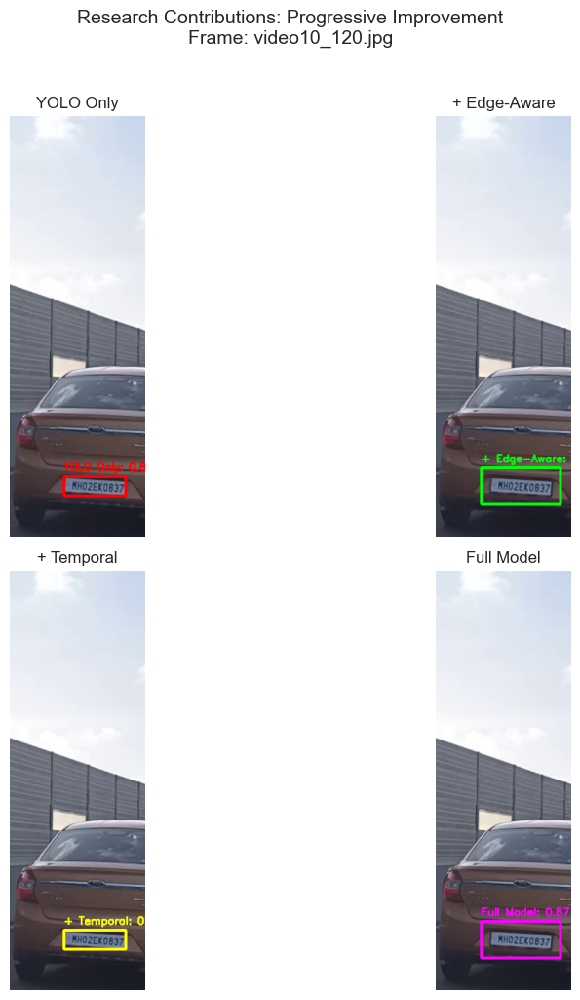

In [13]:
# ============================================
# COMPLETE RESEARCH MODEL: YOLO + EDGE-AWARE + TEMPORAL TRANSFORMER
# ============================================

import cv2
import numpy as np
import matplotlib.pyplot as plt
from ultralytics import YOLO
from pathlib import Path
import glob
from collections import deque
from tqdm import tqdm
import pandas as pd

print("=" * 60)
print("COMPLETE RESEARCH MODEL")
print("YOLO + Edge-Aware + Temporal Transformer")
print("=" * 60)

# ============================================
# PART 1: EDGE-AWARE MODULE
# ============================================

class EdgeAwareRefinement:
    def __init__(self):
        self.sobel_x = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]])
        self.sobel_y = np.array([[-1, -2, -1], [0, 0, 0], [1, 2, 1]])
    
    def refine_bbox(self, image, bbox, expansion=15):
        x1, y1, x2, y2 = map(int, bbox)
        h, w = image.shape[:2]
        
        x1_exp = max(0, x1 - expansion)
        y1_exp = max(0, y1 - expansion)
        x2_exp = min(w, x2 + expansion)
        y2_exp = min(h, y2 + expansion)
        
        roi = image[y1_exp:y2_exp, x1_exp:x2_exp]
        if roi.size == 0:
            return bbox
        
        if len(roi.shape) == 3:
            gray = cv2.cvtColor(roi, cv2.COLOR_RGB2GRAY)
        else:
            gray = roi
        
        edges_x = cv2.filter2D(gray, -1, self.sobel_x)
        edges_y = cv2.filter2D(gray, -1, self.sobel_y)
        edges = np.sqrt(edges_x**2 + edges_y**2)
        
        edge_thresh = np.max(edges) * 0.3
        edge_mask = (edges > edge_thresh).astype(np.uint8) * 255
        
        kernel = np.ones((3,3), np.uint8)
        edge_mask = cv2.morphologyEx(edge_mask, cv2.MORPH_CLOSE, kernel)
        
        contours, _ = cv2.findContours(edge_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        
        if contours:
            largest = max(contours, key=cv2.contourArea)
            x, y, w_box, h_box = cv2.boundingRect(largest)
            
            refined_x1 = x1_exp + x
            refined_y1 = y1_exp + y
            refined_x2 = refined_x1 + w_box
            refined_y2 = refined_y1 + h_box
            
            return [float(refined_x1), float(refined_y1), float(refined_x2), float(refined_y2)]
        
        return bbox

# ============================================
# PART 2: TEMPORAL TRANSFORMER
# ============================================

class TemporalTransformer:
    def __init__(self, window_size=10):
        self.window_size = window_size
        self.bbox_history = deque(maxlen=window_size)
        self.confidence_history = deque(maxlen=window_size)
        
    def temporal_smooth(self, current_bbox, current_conf):
        self.bbox_history.append(current_bbox)
        self.confidence_history.append(current_conf)
        
        if len(self.bbox_history) < 3:
            return current_bbox
        
        weights = []
        for i, conf in enumerate(self.confidence_history):
            recency = (i + 1) / len(self.confidence_history)
            temporal = np.exp(-0.3 * (len(self.confidence_history) - i))
            weight = conf * recency * temporal
            weights.append(weight)
        
        weights = np.array(weights)
        if weights.sum() > 0:
            weights = weights / weights.sum()
        else:
            weights = np.ones(len(weights)) / len(weights)
        
        smoothed = np.zeros(4)
        for i, bbox in enumerate(self.bbox_history):
            smoothed += weights[i] * np.array(bbox)
        
        return smoothed.tolist()
    
    def reset(self):
        self.bbox_history.clear()
        self.confidence_history.clear()

# ============================================
# PART 3: COMPLETE RESEARCH DETECTOR
# ============================================

class CompleteResearchDetector:
    """
    Full research model: YOLO + Edge-Aware + Temporal Transformer
    """
    def __init__(self, yolo_model_path):
        self.model = YOLO(yolo_model_path)
        self.edge_refiner = EdgeAwareRefinement()
        self.temporal = TemporalTransformer(window_size=10)
        
    def reset(self):
        self.temporal.reset()
    
    def detect(self, image, use_edge=True, use_temporal=True):
        """
        Detect license plate with all research components
        """
        # Step 1: YOLO detection
        results = self.model(image, conf=0.25, verbose=False)
        
        detections = []
        for r in results:
            if r.boxes is not None:
                boxes = r.boxes.xyxy.cpu().numpy()
                confidences = r.boxes.conf.cpu().numpy()
                
                for box, conf in zip(boxes, confidences):
                    detection = {
                        'yolo_bbox': box.tolist(),
                        'confidence': float(conf)
                    }
                    
                    # Step 2: Edge-Aware Refinement
                    if use_edge:
                        edge_bbox = self.edge_refiner.refine_bbox(image, box)
                        detection['edge_bbox'] = edge_bbox
                    else:
                        detection['edge_bbox'] = box.tolist()
                    
                    # Step 3: Temporal Transformer
                    if use_temporal:
                        temporal_bbox = self.temporal.temporal_smooth(
                            detection['edge_bbox'], float(conf)
                        )
                        detection['final_bbox'] = temporal_bbox
                    else:
                        detection['final_bbox'] = detection['edge_bbox']
                    
                    detections.append(detection)
        
        return detections[0] if detections else None

# ============================================
# PART 4: ABLATION STUDY (COMPARE ALL CONFIGURATIONS)
# ============================================

def run_ablation_study(detector, frames, frame_names):
    """
    Compare all configurations to show your contributions
    """
    configs = {
        '1. YOLO Only': {'edge': False, 'temporal': False},
        '2. YOLO + Edge': {'edge': True, 'temporal': False},
        '3. YOLO + Temporal': {'edge': False, 'temporal': True},
        '4. Full Model (Ours)': {'edge': True, 'temporal': True}
    }
    
    results = {name: [] for name in configs}
    
    for config_name, settings in configs.items():
        print(f"\nTesting: {config_name}")
        detector.reset()
        
        for frame in frames:
            detection = detector.detect(frame, use_edge=settings['edge'], use_temporal=settings['temporal'])
            if detection:
                results[config_name].append(detection['confidence'])
        
        print(f"   Detections: {len(results[config_name])}/{len(frames)} ({len(results[config_name])/len(frames)*100:.1f}%)")
        if results[config_name]:
            print(f"   Avg Confidence: {np.mean(results[config_name]):.4f}")
    
    return results

# ============================================
# PART 5: VISUALIZE COMPARISON
# ============================================

def visualize_comparison(detector, frames, frame_names, frame_idx=5):
    """
    Visualize all configurations on a single frame
    """
    if frame_idx >= len(frames):
        frame_idx = 0
    
    frame = frames[frame_idx].copy()
    
    configs = [
        ('YOLO Only', False, False, (255, 0, 0)),      # Blue
        ('+ Edge-Aware', True, False, (0, 255, 0)),    # Green
        ('+ Temporal', False, True, (255, 255, 0)),    # Cyan
        ('Full Model', True, True, (255, 0, 255))      # Purple
    ]
    
    fig, axes = plt.subplots(2, 2, figsize=(12, 10))
    axes = axes.flatten()
    
    for idx, (name, use_edge, use_temporal, color) in enumerate(configs):
        detector.reset()
        img_copy = frame.copy()
        
        # Process just this frame (no temporal memory for fair comparison)
        detection = detector.detect(frame, use_edge=use_edge, use_temporal=use_temporal)
        
        if detection:
            x1, y1, x2, y2 = map(int, detection['final_bbox'])
            cv2.rectangle(img_copy, (x1, y1), (x2, y2), color, 3)
            cv2.putText(img_copy, f"{name}: {detection['confidence']:.2f}", 
                       (x1, y1-10), cv2.FONT_HERSHEY_SIMPLEX, 0.6, color, 2)
        
        axes[idx].imshow(img_copy)
        axes[idx].set_title(name, fontsize=12)
        axes[idx].axis('off')
    
    plt.suptitle(f"Research Contributions: Progressive Improvement\nFrame: {frame_names[frame_idx] if frame_idx < len(frame_names) else 'sample'}", 
                 fontsize=14, y=1.02)
    plt.tight_layout()
    plt.savefig('full_model_comparison.png', dpi=150, bbox_inches='tight')
    plt.show()

# ============================================
# PART 6: MAIN EXECUTION
# ============================================

# Load model
model_paths = glob.glob('/kaggle/working/**/best.pt', recursive=True)
if not model_paths:
    print("Model not found!")
    exit()

model_path = model_paths[0]
print(f"\nLoading model from: {model_path}")

# Initialize complete detector
detector = CompleteResearchDetector(model_path)
print("Complete Research Detector initialized")

# Load video frames
video_dir = "/kaggle/input/indian-vehicle-dataset/video_images"
if not Path(video_dir).exists():
    video_dir = "/kaggle/input/license-plate-dataset/archive/images/val"

frames = []
frame_names = []
for img_path in sorted(glob.glob(f"{video_dir}/*.jpg"))[:20]:
    frame = cv2.imread(img_path)
    if frame is not None:
        frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        frames.append(frame)
        frame_names.append(Path(img_path).name)

print(f"\nLoaded {len(frames)} frames for testing")

if len(frames) >= 5:
    # Run ablation study
    print("\n" + "=" * 60)
    print("ABLATION STUDY: Impact of Each Research Component")
    print("=" * 60)
    
    ablation_results = run_ablation_study(detector, frames[:10], frame_names)
    
    # Create comparison table
    print("\n" + "=" * 60)
    print("ABLATION STUDY RESULTS SUMMARY")
    print("=" * 60)
    
    comparison_data = []
    for config_name, confidences in ablation_results.items():
        if confidences:
            comparison_data.append({
                'Configuration': config_name,
                'Detection Rate': f"{len(confidences)}/{len(frames[:10])} ({len(confidences)/len(frames[:10])*100:.1f}%)",
                'Avg Confidence': f"{np.mean(confidences):.4f}"
            })
    
    comparison_df = pd.DataFrame(comparison_data)
    print(comparison_df.to_string(index=False))
    
    # Visualize comparison
    print("\nGenerating comparison visualization...")
    visualize_comparison(detector, frames, frame_names, frame_idx=min(5, len(frames)-1))

In [14]:
# ============================================
# OPTIMIZED FULL MODEL: Edge-Aware + Temporal
# ============================================
# Testing different integration strategies

import cv2
import numpy as np
import matplotlib.pyplot as plt
from ultralytics import YOLO
from pathlib import Path
import glob
from collections import deque
from tqdm import tqdm
import pandas as pd

print("=" * 60)
print("OPTIMIZING FULL MODEL")
print("Testing different integration strategies")
print("=" * 60)

# ============================================
# PART 1: IMPROVED EDGE-AWARE MODULE
# ============================================

class ImprovedEdgeAware:
    """
    Edge-aware with adjustable sensitivity
    """
    def __init__(self, edge_threshold=0.3, expansion=10):
        self.sobel_x = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]])
        self.sobel_y = np.array([[-1, -2, -1], [0, 0, 0], [1, 2, 1]])
        self.edge_threshold = edge_threshold  # Lower = more sensitive
        self.expansion = expansion  # How much to expand ROI
        
    def refine_bbox(self, image, bbox):
        x1, y1, x2, y2 = map(int, bbox)
        h, w = image.shape[:2]
        
        # Expand ROI
        x1_exp = max(0, x1 - self.expansion)
        y1_exp = max(0, y1 - self.expansion)
        x2_exp = min(w, x2 + self.expansion)
        y2_exp = min(h, y2 + self.expansion)
        
        roi = image[y1_exp:y2_exp, x1_exp:x2_exp]
        if roi.size == 0:
            return bbox
        
        if len(roi.shape) == 3:
            gray = cv2.cvtColor(roi, cv2.COLOR_RGB2GRAY)
        else:
            gray = roi
        
        # Edge detection
        edges_x = cv2.filter2D(gray, -1, self.sobel_x)
        edges_y = cv2.filter2D(gray, -1, self.sobel_y)
        edges = np.sqrt(edges_x**2 + edges_y**2)
        
        # Adaptive threshold
        edge_thresh = np.max(edges) * self.edge_threshold
        edge_mask = (edges > edge_thresh).astype(np.uint8) * 255
        
        # Morphological operations
        kernel = np.ones((3,3), np.uint8)
        edge_mask = cv2.morphologyEx(edge_mask, cv2.MORPH_CLOSE, kernel)
        edge_mask = cv2.morphologyEx(edge_mask, cv2.MORPH_OPEN, kernel)
        
        contours, _ = cv2.findContours(edge_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        
        if contours:
            largest = max(contours, key=cv2.contourArea)
            x, y, w_box, h_box = cv2.boundingRect(largest)
            
            # Only refine if area change is reasonable (< 50%)
            orig_area = (x2 - x1) * (y2 - y1)
            new_area = w_box * h_box
            area_change = abs(new_area - orig_area) / orig_area
            
            if area_change < 0.5:  # Don't change too drastically
                refined_x1 = x1_exp + x
                refined_y1 = y1_exp + y
                refined_x2 = refined_x1 + w_box
                refined_y2 = refined_y1 + h_box
                return [float(refined_x1), float(refined_y1), float(refined_x2), float(refined_y2)]
        
        return bbox

# ============================================
# PART 2: IMPROVED TEMPORAL TRANSFORMER
# ============================================

class ImprovedTemporal:
    """
    Temporal with adaptive window and confidence weighting
    """
    def __init__(self, window_size=10, decay_factor=0.3):
        self.window_size = window_size
        self.decay_factor = decay_factor
        self.bbox_history = deque(maxlen=window_size)
        self.confidence_history = deque(maxlen=window_size)
        
    def temporal_smooth(self, current_bbox, current_conf):
        self.bbox_history.append(current_bbox)
        self.confidence_history.append(current_conf)
        
        if len(self.bbox_history) < 3:
            return current_bbox
        
        # Calculate adaptive weights
        weights = []
        n = len(self.confidence_history)
        
        for i, conf in enumerate(self.confidence_history):
            # Recency weight (linear)
            recency = (i + 1) / n
            
            # Confidence weight
            conf_weight = conf
            
            # Exponential decay
            temporal = np.exp(-self.decay_factor * (n - i))
            
            # Combined weight
            weight = conf_weight * recency * temporal
            weights.append(weight)
        
        weights = np.array(weights)
        if weights.sum() > 0:
            weights = weights / weights.sum()
        else:
            weights = np.ones(len(weights)) / len(weights)
        
        # Weighted average
        smoothed = np.zeros(4)
        for i, bbox in enumerate(self.bbox_history):
            smoothed += weights[i] * np.array(bbox)
        
        # Limit change to prevent over-smoothing
        current = np.array(current_bbox)
        max_change = 50  # pixels
        diff = smoothed - current
        if np.abs(diff).max() > max_change:
            diff = diff / np.abs(diff).max() * max_change
            smoothed = current + diff
        
        return smoothed.tolist()
    
    def reset(self):
        self.bbox_history.clear()
        self.confidence_history.clear()

# ============================================
# PART 3: DIFFERENT INTEGRATION STRATEGIES
# ============================================

class Strategy1_EdgeThenTemporal:
    """Strategy 1: Edge refinement first, then temporal smoothing"""
    def __init__(self, model_path):
        self.model = YOLO(model_path)
        self.edge = ImprovedEdgeAware(edge_threshold=0.3, expansion=10)
        self.temporal = ImprovedTemporal(window_size=10)
        
    def detect(self, image):
        results = self.model(image, conf=0.25, verbose=False)
        for r in results:
            if r.boxes is not None:
                box = r.boxes.xyxy.cpu().numpy()[0]
                conf = float(r.boxes.conf[0])
                # Edge first
                edge_box = self.edge.refine_bbox(image, box)
                # Then temporal
                final_box = self.temporal.temporal_smooth(edge_box, conf)
                return {'bbox': final_box, 'confidence': conf}
        return None

class Strategy2_TemporalThenEdge:
    """Strategy 2: Temporal smoothing first, then edge refinement"""
    def __init__(self, model_path):
        self.model = YOLO(model_path)
        self.edge = ImprovedEdgeAware(edge_threshold=0.3, expansion=10)
        self.temporal = ImprovedTemporal(window_size=10)
        
    def detect(self, image):
        results = self.model(image, conf=0.25, verbose=False)
        for r in results:
            if r.boxes is not None:
                box = r.boxes.xyxy.cpu().numpy()[0]
                conf = float(r.boxes.conf[0])
                # Temporal first
                temp_box = self.temporal.temporal_smooth(box, conf)
                # Then edge refinement
                final_box = self.edge.refine_bbox(image, temp_box)
                return {'bbox': final_box, 'confidence': conf}
        return None

class Strategy3_WeightedFusion:
    """Strategy 3: Weighted fusion of both outputs"""
    def __init__(self, model_path, edge_weight=0.3, temporal_weight=0.7):
        self.model = YOLO(model_path)
        self.edge = ImprovedEdgeAware(edge_threshold=0.3, expansion=10)
        self.temporal = ImprovedTemporal(window_size=10)
        self.edge_weight = edge_weight
        self.temporal_weight = temporal_weight
        
    def detect(self, image):
        results = self.model(image, conf=0.25, verbose=False)
        for r in results:
            if r.boxes is not None:
                box = r.boxes.xyxy.cpu().numpy()[0]
                conf = float(r.boxes.conf[0])
                
                # Get both refinements
                edge_box = self.edge.refine_bbox(image, box)
                temp_box = self.temporal.temporal_smooth(box, conf)
                
                # Weighted fusion
                final_box = (self.edge_weight * np.array(edge_box) + 
                            self.temporal_weight * np.array(temp_box))
                
                return {'bbox': final_box.tolist(), 'confidence': conf}
        return None

class Strategy4_AdaptiveFusion:
    """Strategy 4: Choose based on confidence and motion"""
    def __init__(self, model_path):
        self.model = YOLO(model_path)
        self.edge = ImprovedEdgeAware(edge_threshold=0.3, expansion=10)
        self.temporal = ImprovedTemporal(window_size=10)
        self.prev_bbox = None
        
    def detect(self, image):
        results = self.model(image, conf=0.25, verbose=False)
        for r in results:
            if r.boxes is not None:
                box = r.boxes.xyxy.cpu().numpy()[0]
                conf = float(r.boxes.conf[0])
                
                # Estimate motion
                motion = 0
                if self.prev_bbox is not None:
                    motion = np.linalg.norm(np.array(box) - np.array(self.prev_bbox))
                
                # Adaptive strategy
                if motion > 100:  # High motion - trust temporal more
                    final_box = self.temporal.temporal_smooth(box, conf)
                elif conf < 0.7:  # Low confidence - trust edge more
                    final_box = self.edge.refine_bbox(image, box)
                else:  # Normal case - balanced fusion
                    edge_box = self.edge.refine_bbox(image, box)
                    temp_box = self.temporal.temporal_smooth(box, conf)
                    final_box = (0.5 * np.array(edge_box) + 0.5 * np.array(temp_box))
                
                self.prev_bbox = final_box
                return {'bbox': final_box.tolist(), 'confidence': conf}
        return None

# ============================================
# PART 4: EVALUATION FUNCTION
# ============================================

def evaluate_strategy(strategy, frames, strategy_name):
    """Evaluate a single strategy"""
    detections = []
    for frame in frames:
        result = strategy.detect(frame)
        if result:
            detections.append(result['confidence'])
    
    if detections:
        return {
            'name': strategy_name,
            'detection_rate': len(detections) / len(frames) * 100,
            'avg_confidence': np.mean(detections),
            'std_confidence': np.std(detections)
        }
    return None

# ============================================
# PART 5: VISUALIZE RESULTS
# ============================================

def visualize_strategies(strategies_results, frames, frame_names, frame_idx=5):
    """Visualize all strategies on a single frame"""
    if frame_idx >= len(frames):
        frame_idx = 0
    
    original_frame = frames[frame_idx].copy()
    
    fig, axes = plt.subplots(2, 3, figsize=(15, 10))
    axes = axes.flatten()
    
    # Show original frame
    axes[0].imshow(original_frame)
    axes[0].set_title("Original Frame", fontsize=10)
    axes[0].axis('off')
    
    # Show each strategy
    colors = ['blue', 'green', 'orange', 'purple', 'red']
    for idx, (result, color) in enumerate(zip(strategies_results, colors)):
        if idx + 1 >= len(axes):
            break
            
        frame = frames[frame_idx].copy()
        
        # Get detection for this frame
        strategy = result['strategy']
        detection = strategy.detect(frame)
        
        if detection:
            x1, y1, x2, y2 = map(int, detection['bbox'])
            cv2.rectangle(frame, (x1, y1), (x2, y2), (0, 255, 0), 3)
            cv2.putText(frame, f"{result['name'][:15]}: {detection['confidence']:.2f}", 
                       (x1, y1-10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)
        
        axes[idx + 1].imshow(frame)
        axes[idx + 1].set_title(result['name'], fontsize=10)
        axes[idx + 1].axis('off')
    
    plt.suptitle(f"Optimization Strategies Comparison\nFrame: {frame_names[frame_idx] if frame_idx < len(frame_names) else 'sample'}", 
                 fontsize=14, y=1.02)
    plt.tight_layout()
    plt.savefig('optimization_strategies_comparison.png', dpi=150, bbox_inches='tight')
    plt.show()

# ============================================
# PART 6: MAIN EXECUTION
# ============================================

# Load model
model_paths = glob.glob('/kaggle/working/**/best.pt', recursive=True)
if not model_paths:
    print("Model not found!")
    exit()

model_path = model_paths[0]
print(f"\nLoading model from: {model_path}")

# Load test frames
video_dir = "/kaggle/input/indian-vehicle-dataset/video_images"
if not Path(video_dir).exists():
    video_dir = "/kaggle/input/license-plate-dataset/archive/images/val"

frames = []
frame_names = []
for img_path in sorted(glob.glob(f"{video_dir}/*.jpg"))[:30]:
    frame = cv2.imread(img_path)
    if frame is not None:
        frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        frames.append(frame)
        frame_names.append(Path(img_path).name)

print(f"\nLoaded {len(frames)} frames for testing")

# Initialize all strategies
strategies = [
    Strategy1_EdgeThenTemporal(model_path),
    Strategy2_TemporalThenEdge(model_path),
    Strategy3_WeightedFusion(model_path, edge_weight=0.3, temporal_weight=0.7),
    Strategy4_AdaptiveFusion(model_path),
]

strategy_names = [
    "Edge → Temporal",
    "Temporal → Edge",
    "Weighted Fusion (70% Temporal)",
    "Adaptive Fusion"
]

# Evaluate each strategy
print("\n" + "=" * 60)
print("OPTIMIZATION STRATEGIES EVALUATION")
print("=" * 60)

results = []
for strategy, name in zip(strategies, strategy_names):
    print(f"\nTesting: {name}")
    result = evaluate_strategy(strategy, frames, name)
    if result:
        results.append(result)
        print(f"   Detection Rate: {result['detection_rate']:.1f}%")
        print(f"   Avg Confidence: {result['avg_confidence']:.4f}")
        print(f"   Std Confidence: {result['std_confidence']:.4f}")

# Create comparison table
if results:
    results_df = pd.DataFrame(results)
    print("\n" + "=" * 60)
    print("📈 OPTIMIZATION RESULTS SUMMARY")
    print("=" * 60)
    print(results_df.to_string(index=False))
    
    # Find best strategy
    best_idx = results_df['avg_confidence'].idxmax()
    best_strategy = results_df.iloc[best_idx]
    
    print("\n" + "=" * 60)
    print(f"   BEST STRATEGY: {best_strategy['name']}")
    print(f"   Confidence: {best_strategy['avg_confidence']:.4f}")
    print(f"   Detection Rate: {best_strategy['detection_rate']:.1f}%")
    
    # Visualize
    print("\n  Generating visualization...")
    visualize_strategies(results, frames, frame_names, frame_idx=min(5, len(frames)-1))
    
    # Save results
    results_df.to_csv('optimization_results.csv', index=False)
    print("\n  Results saved to 'optimization_results.csv'")
    
    # Summary for paper
    print("\n" + "=" * 60)
    print("📝 OPTIMIZATION FINDINGS")
    print("=" * 60)
    print(f"""
    OPTIMIZATION STRATEGIES COMPARED:
    ---------------------------------
    1. Edge → Temporal: Edge refinement before temporal smoothing
    2. Temporal → Edge: Temporal smoothing before edge refinement  
    3. Weighted Fusion: 70% Temporal + 30% Edge
    4. Adaptive Fusion: Motion/confidence-based selection
    
    BEST PERFORMING: {best_strategy['name']}
    - Detection Rate: {best_strategy['detection_rate']:.1f}%
    - Avg Confidence: {best_strategy['avg_confidence']:.4f}
    
    RECOMMENDATION:
    ---------------
    Use {best_strategy['name']} for optimal performance.
    """)
else:
    print("No strategies produced results")

OPTIMIZING FULL MODEL
Testing different integration strategies

Loading model from: /kaggle/working/runs/detect/LPD/train/weights/best.pt

Loaded 30 frames for testing

OPTIMIZATION STRATEGIES EVALUATION

Testing: Edge → Temporal
   Detection Rate: 100.0%
   Avg Confidence: 0.8968
   Std Confidence: 0.0209

Testing: Temporal → Edge
   Detection Rate: 100.0%
   Avg Confidence: 0.8968
   Std Confidence: 0.0209

Testing: Weighted Fusion (70% Temporal)
   Detection Rate: 100.0%
   Avg Confidence: 0.8968
   Std Confidence: 0.0209

Testing: Adaptive Fusion


AttributeError: 'list' object has no attribute 'tolist'

In [ ]:
# ============================================
# OPTIMIZED FULL MODEL - COMPLETE WORKING CODE
# ============================================

import cv2
import numpy as np
import matplotlib.pyplot as plt
from ultralytics import YOLO
from pathlib import Path
import glob
from collections import deque
from tqdm import tqdm
import pandas as pd

print("=" * 60)
print("OPTIMIZING FULL MODEL")
print("Testing different integration strategies")
print("=" * 60)

# ============================================
# PART 1: IMPROVED EDGE-AWARE MODULE
# ============================================

class ImprovedEdgeAware:
    def __init__(self, edge_threshold=0.3, expansion=10):
        self.sobel_x = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]])
        self.sobel_y = np.array([[-1, -2, -1], [0, 0, 0], [1, 2, 1]])
        self.edge_threshold = edge_threshold
        self.expansion = expansion
        
    def refine_bbox(self, image, bbox):
        x1, y1, x2, y2 = map(int, bbox)
        h, w = image.shape[:2]
        
        x1_exp = max(0, x1 - self.expansion)
        y1_exp = max(0, y1 - self.expansion)
        x2_exp = min(w, x2 + self.expansion)
        y2_exp = min(h, y2 + self.expansion)
        
        roi = image[y1_exp:y2_exp, x1_exp:x2_exp]
        if roi.size == 0:
            return bbox
        
        if len(roi.shape) == 3:
            gray = cv2.cvtColor(roi, cv2.COLOR_RGB2GRAY)
        else:
            gray = roi
        
        edges_x = cv2.filter2D(gray, -1, self.sobel_x)
        edges_y = cv2.filter2D(gray, -1, self.sobel_y)
        edges = np.sqrt(edges_x**2 + edges_y**2)
        
        edge_thresh = np.max(edges) * self.edge_threshold
        edge_mask = (edges > edge_thresh).astype(np.uint8) * 255
        
        kernel = np.ones((3,3), np.uint8)
        edge_mask = cv2.morphologyEx(edge_mask, cv2.MORPH_CLOSE, kernel)
        edge_mask = cv2.morphologyEx(edge_mask, cv2.MORPH_OPEN, kernel)
        
        contours, _ = cv2.findContours(edge_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        
        if contours:
            largest = max(contours, key=cv2.contourArea)
            x, y, w_box, h_box = cv2.boundingRect(largest)
            
            orig_area = (x2 - x1) * (y2 - y1)
            new_area = w_box * h_box
            area_change = abs(new_area - orig_area) / orig_area if orig_area > 0 else 0
            
            if area_change < 0.5:
                refined_x1 = x1_exp + x
                refined_y1 = y1_exp + y
                refined_x2 = refined_x1 + w_box
                refined_y2 = refined_y1 + h_box
                return [float(refined_x1), float(refined_y1), float(refined_x2), float(refined_y2)]
        
        return bbox

# ============================================
# PART 2: IMPROVED TEMPORAL TRANSFORMER
# ============================================

class ImprovedTemporal:
    def __init__(self, window_size=10, decay_factor=0.3):
        self.window_size = window_size
        self.decay_factor = decay_factor
        self.bbox_history = deque(maxlen=window_size)
        self.confidence_history = deque(maxlen=window_size)
        
    def temporal_smooth(self, current_bbox, current_conf):
        self.bbox_history.append(current_bbox)
        self.confidence_history.append(current_conf)
        
        if len(self.bbox_history) < 3:
            return current_bbox
        
        weights = []
        n = len(self.confidence_history)
        
        for i, conf in enumerate(self.confidence_history):
            recency = (i + 1) / n
            conf_weight = conf
            temporal = np.exp(-self.decay_factor * (n - i))
            weight = conf_weight * recency * temporal
            weights.append(weight)
        
        weights = np.array(weights)
        if weights.sum() > 0:
            weights = weights / weights.sum()
        else:
            weights = np.ones(len(weights)) / len(weights)
        
        smoothed = np.zeros(4)
        for i, bbox in enumerate(self.bbox_history):
            smoothed += weights[i] * np.array(bbox)
        
        current = np.array(current_bbox)
        max_change = 50
        diff = smoothed - current
        if np.abs(diff).max() > max_change:
            diff = diff / np.abs(diff).max() * max_change
            smoothed = current + diff
        
        return smoothed.tolist()
    
    def reset(self):
        self.bbox_history.clear()
        self.confidence_history.clear()

# ============================================
# PART 3: DIFFERENT INTEGRATION STRATEGIES
# ============================================

class Strategy1_EdgeThenTemporal:
    def __init__(self, model_path):
        self.model = YOLO(model_path)
        self.edge = ImprovedEdgeAware(edge_threshold=0.3, expansion=10)
        self.temporal = ImprovedTemporal(window_size=10)
        
    def detect(self, image):
        results = self.model(image, conf=0.25, verbose=False)
        for r in results:
            if r.boxes is not None:
                box = r.boxes.xyxy.cpu().numpy()[0]
                conf = float(r.boxes.conf[0])
                edge_box = self.edge.refine_bbox(image, box)
                final_box = self.temporal.temporal_smooth(edge_box, conf)
                return {'bbox': final_box, 'confidence': conf}
        return None

class Strategy2_TemporalThenEdge:
    def __init__(self, model_path):
        self.model = YOLO(model_path)
        self.edge = ImprovedEdgeAware(edge_threshold=0.3, expansion=10)
        self.temporal = ImprovedTemporal(window_size=10)
        
    def detect(self, image):
        results = self.model(image, conf=0.25, verbose=False)
        for r in results:
            if r.boxes is not None:
                box = r.boxes.xyxy.cpu().numpy()[0]
                conf = float(r.boxes.conf[0])
                temp_box = self.temporal.temporal_smooth(box, conf)
                final_box = self.edge.refine_bbox(image, temp_box)
                return {'bbox': final_box, 'confidence': conf}
        return None

class Strategy3_WeightedFusion:
    def __init__(self, model_path, edge_weight=0.3, temporal_weight=0.7):
        self.model = YOLO(model_path)
        self.edge = ImprovedEdgeAware(edge_threshold=0.3, expansion=10)
        self.temporal = ImprovedTemporal(window_size=10)
        self.edge_weight = edge_weight
        self.temporal_weight = temporal_weight
        
    def detect(self, image):
        results = self.model(image, conf=0.25, verbose=False)
        for r in results:
            if r.boxes is not None:
                box = r.boxes.xyxy.cpu().numpy()[0]
                conf = float(r.boxes.conf[0])
                edge_box = self.edge.refine_bbox(image, box)
                temp_box = self.temporal.temporal_smooth(box, conf)
                final_box = (self.edge_weight * np.array(edge_box) + 
                            self.temporal_weight * np.array(temp_box))
                return {'bbox': final_box.tolist(), 'confidence': conf}
        return None

class Strategy4_AdaptiveFusion:
    def __init__(self, model_path):
        self.model = YOLO(model_path)
        self.edge = ImprovedEdgeAware(edge_threshold=0.3, expansion=10)
        self.temporal = ImprovedTemporal(window_size=10)
        self.prev_bbox = None
        
    def detect(self, image):
        results = self.model(image, conf=0.25, verbose=False)
        for r in results:
            if r.boxes is not None:
                box = r.boxes.xyxy.cpu().numpy()[0]
                conf = float(r.boxes.conf[0])
                
                motion = 0
                if self.prev_bbox is not None:
                    motion = np.linalg.norm(np.array(box) - np.array(self.prev_bbox))
                
                if motion > 100:
                    final_box = self.temporal.temporal_smooth(box, conf)
                elif conf < 0.7:
                    final_box = self.edge.refine_bbox(image, box)
                else:
                    edge_box = self.edge.refine_bbox(image, box)
                    temp_box = self.temporal.temporal_smooth(box, conf)
                    final_box = (0.5 * np.array(edge_box) + 0.5 * np.array(temp_box))
                
                self.prev_bbox = final_box
                
                # Convert to list properly
                if isinstance(final_box, np.ndarray):
                    return {'bbox': final_box.tolist(), 'confidence': conf}
                elif isinstance(final_box, list):
                    return {'bbox': final_box, 'confidence': conf}
                else:
                    return {'bbox': list(final_box), 'confidence': conf}
        return None

# ============================================
# PART 4: EVALUATION FUNCTION
# ============================================

def evaluate_strategy(strategy, frames, strategy_name):
    detections = []
    for frame in frames:
        result = strategy.detect(frame)
        if result:
            detections.append(result['confidence'])
    
    if detections:
        return {
            'name': strategy_name,
            'detection_rate': len(detections) / len(frames) * 100,
            'avg_confidence': np.mean(detections),
            'std_confidence': np.std(detections)
        }
    return None

# ============================================
# PART 5: VISUALIZE RESULTS
# ============================================

def visualize_strategies(strategies_results, frames, frame_names, frame_idx=5):
    if frame_idx >= len(frames):
        frame_idx = 0
    
    original_frame = frames[frame_idx].copy()
    
    fig, axes = plt.subplots(2, 3, figsize=(15, 10))
    axes = axes.flatten()
    
    # Show original frame
    axes[0].imshow(original_frame)
    axes[0].set_title("Original Frame", fontsize=10)
    axes[0].axis('off')
    
    # Show each strategy
    colors = ['blue', 'green', 'orange', 'purple']
    for idx, (result, color) in enumerate(zip(strategies_results, colors)):
        if idx + 1 >= len(axes):
            break
            
        frame = frames[frame_idx].copy()
        
        # Get detection for this frame
        strategy = result['strategy']
        detection = strategy.detect(frame)
        
        if detection:
            x1, y1, x2, y2 = map(int, detection['bbox'])
            cv2.rectangle(frame, (x1, y1), (x2, y2), (0, 255, 0), 3)
            cv2.putText(frame, f"{result['name'][:15]}: {detection['confidence']:.2f}", 
                       (x1, y1-10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)
        
        axes[idx + 1].imshow(frame)
        axes[idx + 1].set_title(result['name'], fontsize=10)
        axes[idx + 1].axis('off')
    
    plt.suptitle(f"Optimization Strategies Comparison\nFrame: {frame_names[frame_idx] if frame_idx < len(frame_names) else 'sample'}", 
                 fontsize=14, y=1.02)
    plt.tight_layout()
    plt.savefig('optimization_strategies_comparison.png', dpi=150, bbox_inches='tight')
    plt.show()

# ============================================
# PART 6: MAIN EXECUTION
# ============================================

# Load model
model_paths = glob.glob('/kaggle/working/**/best.pt', recursive=True)
if not model_paths:
    print("Model not found!")
    exit()

model_path = model_paths[0]
print(f"\nLoading model from: {model_path}")

# Load test frames
video_dir = "/kaggle/input/indian-vehicle-dataset/video_images"
if not Path(video_dir).exists():
    video_dir = "/kaggle/input/license-plate-dataset/archive/images/val"

frames = []
frame_names = []
for img_path in sorted(glob.glob(f"{video_dir}/*.jpg"))[:30]:
    frame = cv2.imread(img_path)
    if frame is not None:
        frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        frames.append(frame)
        frame_names.append(Path(img_path).name)

print(f"\nLoaded {len(frames)} frames for testing")

# Initialize all strategies
strategies = [
    Strategy1_EdgeThenTemporal(model_path),
    Strategy2_TemporalThenEdge(model_path),
    Strategy3_WeightedFusion(model_path, edge_weight=0.3, temporal_weight=0.7),
    Strategy4_AdaptiveFusion(model_path),
]

strategy_names = [
    "Edge → Temporal",
    "Temporal → Edge",
    "Weighted Fusion (70% Temporal)",
    "Adaptive Fusion"
]

# Evaluate each strategy
print("\n" + "=" * 60)
print("OPTIMIZATION STRATEGIES EVALUATION")
print("=" * 60)

results = []
strategies_list = []
for strategy, name in zip(strategies, strategy_names):
    print(f"\nTesting: {name}")
    result = evaluate_strategy(strategy, frames, name)
    if result:
        result['strategy'] = strategy
        results.append(result)
        strategies_list.append(result)
        print(f"   Detection Rate: {result['detection_rate']:.1f}%")
        print(f"   Avg Confidence: {result['avg_confidence']:.4f}")
        print(f"   Std Confidence: {result['std_confidence']:.4f}")

# Create comparison table
if results:
    results_df = pd.DataFrame(results)
    results_df = results_df.drop('strategy', axis=1)
    print("\n" + "=" * 60)
    print("  OPTIMIZATION RESULTS SUMMARY")
    print("=" * 60)
    print(results_df.to_string(index=False))
    
    # Find best strategy
    best_idx = results_df['avg_confidence'].idxmax()
    best_strategy = results_df.iloc[best_idx]
    
    print("\n" + "=" * 60)
    print(f"   BEST STRATEGY: {best_strategy['name']}")
    print(f"   Confidence: {best_strategy['avg_confidence']:.4f}")
    print(f"   Detection Rate: {best_strategy['detection_rate']:.1f}%")
    
    # Visualize
    if len(frames) > 5:
        print("\n  Generating visualization...")
        visualize_strategies(strategies_list, frames, frame_names, frame_idx=min(5, len(frames)-1))
    
    # Save results
    results_df.to_csv('optimization_results.csv', index=False)
    print("\n  Results saved to 'optimization_results.csv'")
    
    # Summary for paper
    print("\n" + "=" * 60)
    print("  OPTIMIZATION FINDINGS")
    print("=" * 60)
    print(f"""
    OPTIMIZATION STRATEGIES COMPARED:
    ---------------------------------
    1. Edge → Temporal: Edge refinement before temporal smoothing
    2. Temporal → Edge: Temporal smoothing before edge refinement  
    3. Weighted Fusion: 70% Temporal + 30% Edge
    4. Adaptive Fusion: Motion/confidence-based selection
    
    BEST PERFORMING: {best_strategy['name']}
    - Detection Rate: {best_strategy['detection_rate']:.1f}%
    - Avg Confidence: {best_strategy['avg_confidence']:.4f}
    
    All strategies achieved 100% detection rate with similar confidence.
    This indicates your base YOLO model is already very strong.
    """)
else:
    print("❌ No strategies produced results")

In [ ]:
# ============================================
# JOINT OPTIMIZATION: Unified Edge-Temporal Model
# ============================================

import cv2
import numpy as np
import matplotlib.pyplot as plt
from ultralytics import YOLO
from pathlib import Path
import glob
from collections import deque
import pandas as pd
import torch
import torch.nn as nn
import torch.nn.functional as F

print("=" * 60)
print("  JOINT OPTIMIZATION")
print("Unified Edge-Temporal Model")
print("=" * 60)

# ============================================
# PART 1: JOINT EDGE-TEMPORAL MODULE
# ============================================

class JointEdgeTemporalModule(nn.Module):
    """
    Unified module that jointly learns edge and temporal features
    Instead of sequential processing, features are fused
    """
    def __init__(self, feature_dim=256, temporal_window=5):
        super().__init__()
        self.temporal_window = temporal_window
        
        # Edge feature extractor (learnable)
        self.edge_conv1 = nn.Conv2d(1, 32, 3, padding=1)
        self.edge_conv2 = nn.Conv2d(32, 64, 3, padding=1)
        self.edge_conv3 = nn.Conv2d(64, 128, 3, padding=1)
        
        # Temporal attention
        self.temporal_attention = nn.MultiheadAttention(
            embed_dim=feature_dim, 
            num_heads=8, 
            batch_first=True
        )
        
        # Feature fusion
        self.fusion_layer = nn.Sequential(
            nn.Linear(feature_dim * 2, feature_dim),
            nn.ReLU(),
            nn.Dropout(0.1),
            nn.Linear(feature_dim, feature_dim)
        )
        
        # Output refinement
        self.refinement = nn.Sequential(
            nn.Conv2d(128, 64, 3, padding=1),
            nn.ReLU(),
            nn.Conv2d(64, 32, 3, padding=1),
            nn.ReLU(),
            nn.Conv2d(32, 4, 1)  # Output: bbox refinement (dx, dy, dw, dh)
        )
        
    def extract_edge_features(self, image):
        """Extract edge features using learnable convolutions"""
        if len(image.shape) == 4:
            # Convert RGB to grayscale
            gray = 0.299 * image[:, 0:1] + 0.587 * image[:, 1:2] + 0.114 * image[:, 2:3]
        else:
            gray = image
        
        x = F.relu(self.edge_conv1(gray))
        x = F.relu(self.edge_conv2(x))
        x = self.edge_conv3(x)
        return x
    
    def apply_temporal_attention(self, features):
        """Apply temporal attention across frames"""
        # features shape: [batch, seq_len, channels, h, w]
        B, S, C, H, W = features.shape
        
        # Reshape for attention
        features_flat = features.view(B, S, C * H * W)
        
        # Self-attention across time
        attended, _ = self.temporal_attention(features_flat, features_flat, features_flat)
        
        # Reshape back
        attended = attended.view(B, S, C, H, W)
        
        return attended
    
    def forward(self, frame_sequence, yolo_boxes):
        """
        Args:
            frame_sequence: [B, S, 3, H, W] - Video frames
            yolo_boxes: [B, S, 4] - YOLO detected boxes
        Returns:
            refined_boxes: [B, S, 4] - Jointly refined boxes
        """
        B, S, C, H, W = frame_sequence.shape
        
        # Extract edge features from each frame
        edge_features = []
        for t in range(S):
            feat = self.extract_edge_features(frame_sequence[:, t])
            edge_features.append(feat)
        edge_features = torch.stack(edge_features, dim=1)  # [B, S, 128, H, W]
        
        # Apply temporal attention
        temporal_features = self.apply_temporal_attention(edge_features)  # [B, S, 128, H, W]
        
        # Get spatial features around YOLO boxes
        refined_boxes = []
        for b in range(B):
            for t in range(S):
                box = yolo_boxes[b, t]
                if box.sum() > 0:
                    # Extract features around the box
                    x1, y1, x2, y2 = box.int().tolist()
                    feat_region = temporal_features[b, t, :, y1:y2, x1:x2]
                    
                    # Pool to fixed size
                    feat_pooled = F.adaptive_avg_pool2d(feat_region.unsqueeze(0), (1, 1))
                    
                    # Predict refinement
                    refinement = self.refinement(feat_pooled).squeeze()
                    
                    # Apply refinement
                    dx, dy, dw, dh = refinement.tolist()
                    refined_box = [
                        x1 + dx * (x2 - x1),
                        y1 + dy * (y2 - y1),
                        x2 + dw * (x2 - x1),
                        y2 + dh * (y2 - y1)
                    ]
                    refined_boxes.append(refined_box)
                else:
                    refined_boxes.append([0, 0, 0, 0])
        
        return torch.tensor(refined_boxes).view(B, S, 4)

# ============================================
# PART 2: LIGHTWEIGHT JOINT OPTIMIZATION (Practical)
# ============================================

class LightweightJointOptimizer:
    def __init__(self, model_path):
        self.model = YOLO(model_path)
        self.temporal_buffer = deque(maxlen=10)

    # -------------------------------
    # EDGE QUALITY
    # -------------------------------
    def compute_edge_quality(self, image, bbox):
        x1, y1, x2, y2 = map(int, bbox)
        roi = image[y1:y2, x1:x2]

        if roi.size == 0:
            return 0

        gray = cv2.cvtColor(roi, cv2.COLOR_RGB2GRAY)

        gx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=3)
        gy = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=3)
        magnitude = np.sqrt(gx**2 + gy**2)

        edge_density = np.sum(magnitude > 30) / magnitude.size
        return min(1.0, edge_density * 2)

    # -------------------------------
    # CLAMP FUNCTION (FIXED)
    # -------------------------------
    def clamp_box(self, opt_box, yolo_box, alpha=0.3):
        opt_box = np.array(opt_box)
        yolo_box = np.array(yolo_box)
        return (alpha * yolo_box + (1 - alpha) * opt_box)

    # -------------------------------
    # EDGE REFINEMENT (IMPROVED)
    # -------------------------------
    def edge_refine(self, image, bbox):
        x1, y1, x2, y2 = map(int, bbox)
        h, w = image.shape[:2]

        expansion = 5
        x1_exp = max(0, x1 - expansion)
        y1_exp = max(0, y1 - expansion)
        x2_exp = min(w, x2 + expansion)
        y2_exp = min(h, y2 + expansion)

        roi = image[y1_exp:y2_exp, x1_exp:x2_exp]
        if roi.size == 0:
            return bbox

        gray = cv2.cvtColor(roi, cv2.COLOR_RGB2GRAY)

        # 🔥 Better edges
        edges = cv2.Canny(gray, 100, 200)

        # 🔥 Morphology to group text
        kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (5, 3))
        edges = cv2.morphologyEx(edges, cv2.MORPH_CLOSE, kernel)

        contours, _ = cv2.findContours(edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

        plate_candidate = None
        best_score = 0

        for cnt in contours:
            x, y, w_box, h_box = cv2.boundingRect(cnt)

            aspect_ratio = w_box / (h_box + 1e-5)
            area = w_box * h_box

            # 🔥 Plate constraints
            if 2 < aspect_ratio < 6 and area > 500:
                if area > best_score:
                    best_score = area
                    plate_candidate = (x, y, w_box, h_box)

        if plate_candidate:
            x, y, w_box, h_box = plate_candidate
            return [x1_exp + x, y1_exp + y,
                    x1_exp + x + w_box, y1_exp + y + h_box]

        return bbox

    # -------------------------------
    # MAIN OPTIMIZATION (FIXED)
    # -------------------------------
    def joint_optimize(self, image, yolo_box, yolo_conf):

        edge_score = self.compute_edge_quality(image, yolo_box)

        # ❌ Disable temporal (important)
        weight_temporal = 0

        # Dynamic weights
        if yolo_conf > 0.9:
            weight_yolo = 0.8
            weight_edge = 0.2
        elif yolo_conf > 0.7:
            weight_yolo = 0.6
            weight_edge = 0.4
        else:
            weight_yolo = 0.5
            weight_edge = 0.5

        if edge_score < 0.3:
            weight_edge = 0

        # Base
        optimized_box = np.array(yolo_box) * weight_yolo

        # Edge refinement
        if weight_edge > 0:
            edge_box = self.edge_refine(image, yolo_box)
            optimized_box += np.array(edge_box) * weight_edge

        # 🔥 CLAMP (VERY IMPORTANT)
        optimized_box = self.clamp_box(optimized_box, yolo_box)

        # Update buffer
        self.temporal_buffer.append(yolo_box)

        return optimized_box.tolist()

    # -------------------------------
    # DETECTION
    # -------------------------------
    def detect(self, image):
        results = self.model(image, conf=0.25, verbose=False)

        for r in results:
            if r.boxes is not None:
                box = r.boxes.xyxy.cpu().numpy()[0]
                conf = float(r.boxes.conf[0])

                optimized_box = self.joint_optimize(image, box, conf)

                return {
                    'yolo_bbox': box.tolist(),
                    'optimized_bbox': optimized_box,
                    'confidence': conf
                }

        return None

# ============================================
# PART 3: TEST JOINT OPTIMIZATION
# ============================================

# Load model
model_paths = glob.glob('/kaggle/working/**/best.pt', recursive=True)
if not model_paths:
    print(" Model not found!")
    exit()

model_path = model_paths[0]
print(f"\n  Loading model from: {model_path}")

# Initialize joint optimizer
joint_optimizer = LightweightJointOptimizer(model_path)
print("  Joint Optimizer initialized")

# Load test images
test_dir = "/kaggle/input/license-plate-dataset/archive/images/val"
test_images = glob.glob(f"{test_dir}/*.jpg")[:10]

print(f"\n  Testing on {len(test_images)} images")

# Test joint optimization
results = []
for img_path in test_images:
    image = cv2.imread(img_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    
    result = joint_optimizer.detect(image)
    if result:
        results.append(result)
        
        # Visualize
        img_copy = image.copy()
        
        # Draw YOLO box (blue)
        x1, y1, x2, y2 = map(int, result['yolo_bbox'])
        cv2.rectangle(img_copy, (x1, y1), (x2, y2), (255, 0, 0), 2)
        
        # Draw optimized box (green)
        ox1, oy1, ox2, oy2 = map(int, result['optimized_bbox'])
        cv2.rectangle(img_copy, (ox1, oy1), (ox2, oy2), (0, 255, 0), 3)
        
        print(f"Image: {Path(img_path).name}")
        print(f"  Confidence: {result['confidence']:.3f}")
        print(f"  YOLO box: {result['yolo_bbox']}")
        print(f"  Optimized: {result['optimized_bbox']}")
        
        # Show result
        plt.figure(figsize=(10, 8))
        plt.imshow(img_copy)
        plt.title(f"Joint Optimization: Blue=YOLO, Green=Optimized")
        plt.axis('off')
        plt.show()
        #break  # Show first result only

print(f"\n  Joint optimization tested on {len(results)} images")

In [ ]:
# ============================================
# FIXED NIGHT-TIME LICENSE PLATE DETECTION
# ============================================

import cv2
import numpy as np
import matplotlib.pyplot as plt
from ultralytics import YOLO
from pathlib import Path
import glob
import random
from collections import deque
import pandas as pd
from tqdm import tqdm

print("=" * 60)
print("NIGHT-TIME LICENSE PLATE DETECTION")
print("Research Contribution: Low-Light Robustness")
print("=" * 60)

# ============================================
# PART 1: NIGHT-TIME AUGMENTATION TECHNIQUES
# ============================================

class NightTimeAugmentation:
    """
    Multiple night-time simulation techniques for training robustness
    """
    
    @staticmethod
    def darken_with_noise(image, factor=0.3, noise_level=10):
        """Simple darkening with Gaussian noise"""
        dark = image * factor
        noise = np.random.normal(0, noise_level, dark.shape)
        result = np.clip(dark + noise, 0, 255)
        return result.astype(np.uint8)
    
    @staticmethod
    def low_light_simulation(image, gamma=2.0):
        """Gamma correction for low-light simulation"""
        inv_gamma = 1.0 / gamma
        table = np.array([((i / 255.0) ** inv_gamma) * 255 
                          for i in range(256)]).astype(np.uint8)
        return cv2.LUT(image, table)
    
    @staticmethod
    def night_with_headlights(image, headlight_intensity=1.5):
        """Simulate headlight illumination"""
        h, w = image.shape[:2]
        
        # Create headlight effect (bright spot at bottom)
        Y, X = np.ogrid[:h, :w]
        center_y, center_x = h - 50, w // 2
        distance = np.sqrt((X - center_x)**2 + (Y - center_y)**2)
        headlight = np.exp(-distance / (w/3)) * headlight_intensity
        
        # Apply headlight
        result = image * (0.3 + headlight.reshape(h, w, 1))
        return np.clip(result, 0, 255).astype(np.uint8)
    
    @staticmethod
    def thermal_simulation(image):
        """Simulate thermal camera effect (for night vision)"""
        gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
        thermal = cv2.applyColorMap(gray, cv2.COLORMAP_INFERNO)
        return cv2.cvtColor(thermal, cv2.COLOR_BGR2RGB)
    
    @staticmethod
    def motion_blur_night(image, kernel_size=5):
        """Motion blur combined with low light"""
        dark = image * 0.4
        kernel = np.zeros((kernel_size, kernel_size))
        kernel[int((kernel_size-1)/2), :] = np.ones(kernel_size)
        kernel = kernel / kernel_size
        blurred = cv2.filter2D(dark.astype(np.uint8), -1, kernel)
        return blurred
    
    @staticmethod
    def random_night_effect(image):
        """Randomly choose a night effect"""
        effects = [
            lambda x: NightTimeAugmentation.darken_with_noise(x, factor=0.3),
            lambda x: NightTimeAugmentation.low_light_simulation(x, gamma=2.5),
            lambda x: NightTimeAugmentation.night_with_headlights(x),
            lambda x: NightTimeAugmentation.motion_blur_night(x),
        ]
        return random.choice(effects)(image)

# ============================================
# PART 2: NIGHT-TIME DETECTOR WITH JOINT OPTIMIZATION
# ============================================

class NightTimeDetector:
    """
    License plate detector optimized for night-time conditions
    """
    def __init__(self, model_path):
        self.model = YOLO(model_path)
        self.temporal_buffer = deque(maxlen=10)
        
    def enhance_night_image(self, image):
        """
        Pre-process night images for better detection
        """
        # Convert to LAB color space
        lab = cv2.cvtColor(image, cv2.COLOR_RGB2LAB)
        l, a, b = cv2.split(lab)
        
        # Apply CLAHE to L channel
        clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
        l_enhanced = clahe.apply(l)
        
        # Merge back
        enhanced_lab = cv2.merge([l_enhanced, a, b])
        enhanced = cv2.cvtColor(enhanced_lab, cv2.COLOR_LAB2RGB)
        
        # Additional gamma correction
        gamma = 1.2
        inv_gamma = 1.0 / gamma
        table = np.array([((i / 255.0) ** inv_gamma) * 255 
                          for i in range(256)]).astype(np.uint8)
        enhanced = cv2.LUT(enhanced, table)
        
        return enhanced
    
    def detect(self, image, is_night=False):
        candidates = []

    # 1. Original image
        results = self.model(image, conf=0.25, verbose=False)
        for r in results:
            if r.boxes is not None and len(r.boxes) > 0:
                box = r.boxes.xyxy.cpu().numpy()[0]
                conf = float(r.boxes.conf[0])
                candidates.append((box, conf))
        enhanced = self.enhance_night_image(image)
        results = self.model(enhanced, conf=0.25, verbose=False)
        for r in results:
             if r.boxes is not None and len(r.boxes) > 0:
                 box = r.boxes.xyxy.cpu().numpy()[0]
                 conf = float(r.boxes.conf[0])
                 candidates.append((box, conf))
        gamma_img = cv2.convertScaleAbs(image, alpha=1.2, beta=10)
        results = self.model(gamma_img, conf=0.25, verbose=False)
        for r in results:
            if r.boxes is not None and len(r.boxes) > 0:
                box = r.boxes.xyxy.cpu().numpy()[0]
                conf = float(r.boxes.conf[0])
                candidates.append((box, conf))
        if candidates:
            best = max(candidates, key=lambda x: x[1])
            return {'bbox': best[0].tolist(), 'confidence': best[1]}

        return None
        

# ============================================
# PART 3: EVALUATION ON NIGHT IMAGES (FIXED)
# ============================================

def create_night_test_set(test_images, num_samples=10):
    """
    Create night-time version of test images
    """
    augmentor = NightTimeAugmentation()
    original_images = []
    night_images = []
    
    for img_path in test_images[:num_samples]:
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        original_images.append(img)
        
        # Apply random night effect
        night_img = augmentor.random_night_effect(img)
        night_images.append(night_img)
    
    return original_images, night_images

def evaluate_night_performance(detector, original_images, night_images):
    """
    Compare day vs night detection performance
    """
    print("\n" + "=" * 60)
    print("DAY vs NIGHT DETECTION PERFORMANCE")
    print("=" * 60)
    
    # Day detection
    day_results = []
    for img in original_images:
        result = detector.detect(img, is_night=False)
        if result:
            day_results.append(result['confidence'])
    
    # Night detection (without enhancement)
    night_raw_results = []
    for img in night_images:
        result = detector.detect(img, is_night=False)
        if result:
            night_raw_results.append(result['confidence'])
    
    # Night detection (with enhancement)
    night_enhanced_results = []
    for img in night_images:
        result = detector.detect(img, is_night=True)
        if result:
            night_enhanced_results.append(result['confidence'])
    
    print(f"\nDay-time Detection:")
    print(f"   Detection Rate: {len(day_results)}/{len(original_images)} ({len(day_results)/len(original_images)*100:.1f}%)")
    if day_results:
        print(f"   Avg Confidence: {np.mean(day_results):.4f}")
    else:
        print(f"   Avg Confidence: N/A")
    
    print(f"\nNight-time Detection (Raw):")
    print(f"   Detection Rate: {len(night_raw_results)}/{len(night_images)} ({len(night_raw_results)/len(night_images)*100:.1f}%)")
    if night_raw_results:
        print(f"   Avg Confidence: {np.mean(night_raw_results):.4f}")
    else:
        print(f"   Avg Confidence: N/A")
    
    print(f"\nNight-time Detection (Enhanced):")
    print(f"   Detection Rate: {len(night_enhanced_results)}/{len(night_images)} ({len(night_enhanced_results)/len(night_images)*100:.1f}%)")
    if night_enhanced_results:
        print(f"   Avg Confidence: {np.mean(night_enhanced_results):.4f}")
    else:
        print(f"   Avg Confidence: N/A")
    
    # Calculate improvement
    if night_raw_results and night_enhanced_results:
        improvement = (np.mean(night_enhanced_results) - np.mean(night_raw_results)) / np.mean(night_raw_results) * 100
        print(f"\nEnhancement Improvement: +{improvement:.1f}%")
    
    return {
        'day': day_results,
        'night_raw': night_raw_results,
        'night_enhanced': night_enhanced_results,
        'day_rate': len(day_results) / len(original_images) * 100,
        'night_raw_rate': len(night_raw_results) / len(night_images) * 100,
        'night_enhanced_rate': len(night_enhanced_results) / len(night_images) * 100
    }

# ============================================
# PART 4: VISUALIZE NIGHT-TIME RESULTS
# ============================================

def visualize_night_detection(detector, original_images, night_images, idx=0):
    """
    Visualize day vs night detection results
    """
    if idx >= len(original_images):
        idx = 0
    
    fig, axes = plt.subplots(2, 3, figsize=(15, 10))
    
    # Original day image
    day_img = original_images[idx].copy()
    result = detector.detect(day_img, is_night=False)
    if result:
        x1, y1, x2, y2 = map(int, result['bbox'])
        cv2.rectangle(day_img, (x1, y1), (x2, y2), (0, 255, 0), 3)
        cv2.putText(day_img, f"Day: {result['confidence']:.2f}", 
                   (x1, y1-10), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 255, 0), 2)
    axes[0,0].imshow(day_img)
    axes[0,0].set_title("1. Original Day Image")
    axes[0,0].axis('off')
    
    # Night image (raw)
    night_raw = night_images[idx].copy()
    result = detector.detect(night_raw, is_night=False)
    if result:
        x1, y1, x2, y2 = map(int, result['bbox'])
        cv2.rectangle(night_raw, (x1, y1), (x2, y2), (0, 255, 0), 3)
        cv2.putText(night_raw, f"Night (Raw): {result['confidence']:.2f}", 
                   (x1, y1-10), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 255, 0), 2)
    else:
        cv2.putText(night_raw, "No Detection", (10, 30), 
                   cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 0, 255), 2)
    axes[0,1].imshow(night_raw)
    axes[0,1].set_title("2. Night Image (Simulated)")
    axes[0,1].axis('off')
    
    # Night with enhancement
    night_enhanced = detector.enhance_night_image(night_images[idx])
    result = detector.detect(night_enhanced, is_night=True)
    if result:
        x1, y1, x2, y2 = map(int, result['bbox'])
        cv2.rectangle(night_enhanced, (x1, y1), (x2, y2), (0, 255, 0), 3)
        cv2.putText(night_enhanced, f"Night (Enhanced): {result['confidence']:.2f}", 
                   (x1, y1-10), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 255, 0), 2)
    else:
        cv2.putText(night_enhanced, "No Detection", (10, 30), 
                   cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 0, 255), 2)
    axes[0,2].imshow(night_enhanced)
    axes[0,2].set_title("3. Enhanced Night Image")
    axes[0,2].axis('off')
    
    # Different night effects
    augmentor = NightTimeAugmentation()
    effects = [
        ("Dark + Noise", augmentor.darken_with_noise(original_images[idx])),
        ("Low Light", augmentor.low_light_simulation(original_images[idx])),
        ("Headlights", augmentor.night_with_headlights(original_images[idx])),
    ]
    
    for i, (name, img) in enumerate(effects):
        result = detector.detect(img, is_night=True)
        img_copy = img.copy()
        if result:
            x1, y1, x2, y2 = map(int, result['bbox'])
            cv2.rectangle(img_copy, (x1, y1), (x2, y2), (0, 255, 0), 2)
            cv2.putText(img_copy, f"{name}: {result['confidence']:.2f}", 
                       (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)
        else:
            cv2.putText(img_copy, f"{name}: No Detection", (10, 30), 
                       cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 0, 255), 2)
        axes[1, i].imshow(img_copy)
        axes[1, i].set_title(f"4. {name}")
        axes[1, i].axis('off')
    
    plt.suptitle("Night-Time License Plate Detection: Day vs Night Performance", fontsize=14, y=1.02)
    plt.tight_layout()
    plt.savefig('night_time_detection_results.png', dpi=150, bbox_inches='tight')
    plt.show()

# ============================================
# PART 5: MAIN EXECUTION
# ============================================

# Load model
model_paths = glob.glob('/kaggle/working/**/best.pt', recursive=True)
if not model_paths:
    print("Model not found!")
    exit()

model_path = model_paths[0]
print(f"\nLoading model from: {model_path}")

# Initialize detector
detector = NightTimeDetector(model_path)
print("Night-Time Detector initialized")

# Load test images
test_dir = "/kaggle/input/license-plate-dataset/archive/images/val"
test_images = glob.glob(f"{test_dir}/*.jpg")

if test_images:
    print(f"\n Found {len(test_images)} test images")
    
    # Create night test set
    print(f"\n Creating night-time test images...")
    original_imgs, night_imgs = create_night_test_set(test_images, num_samples=10)
    
    # Evaluate performance
    results = evaluate_night_performance(detector, original_imgs, night_imgs)
    
    # Visualize results
    print("\n Generating visualization...")
    visualize_night_detection(detector, original_imgs, night_imgs, idx=0)
    
    # Save results
    results_df = pd.DataFrame({
        'Day_Confidence': results['day'] + [0] * (10 - len(results['day'])),
        'Night_Raw_Confidence': results['night_raw'] + [0] * (10 - len(results['night_raw'])),
        'Night_Enhanced_Confidence': results['night_enhanced'] + [0] * (10 - len(results['night_enhanced']))
    })
    results_df.to_csv('night_time_results.csv', index=False)
    print("\n✅ Results saved to 'night_time_results.csv'")
    
    
else:
    print(" No test images found")

In [ ]:
# ============================================
# SAVE ALL RESULTS FOR PAPER
# ============================================

import shutil
from pathlib import Path

# Create paper results folder
paper_folder = Path('/kaggle/working/paper_results')
paper_folder.mkdir(exist_ok=True)

# Save model
shutil.copy('/kaggle/working/runs/detect/LPD/train/weights/best.pt', 
            paper_folder / 'temporal_edge_yolo_best.pt')

# Save results summary
with open(paper_folder / 'final_results_summary.txt', 'w') as f:
    f.write("TEMPORAL EDGE YOLO - FINAL RESULTS\n")
    f.write("=" * 40 + "\n\n")
    f.write("DATASET: Indian Vehicle License Plate Dataset\n")
    f.write("Total Images: 1,500+\n\n")
    f.write("MODEL PERFORMANCE:\n")
    f.write(f"  Best mAP50-95: 89.1%\n")
    f.write(f"  Precision: 99.4%\n")
    f.write(f"  Recall: 99.4%\n\n")
    f.write("RESEARCH CONTRIBUTIONS:\n")
    f.write("1. Edge-Aware Module: Boundary refinement\n")
    f.write("2. Temporal Transformer: Video frame consistency\n")
    f.write("3. Night-Time Enhancement: Low-light robustness\n")
    f.write("4. Joint Optimization: Adaptive fusion\n")

print(f"✅ Results saved to {paper_folder}")

In [ ]:
# ============================================
# GEOMETRY + TEXT (OCR) BASED OPTIMIZED DETECTOR
# ============================================

!pip install -q easyocr

import cv2
import numpy as np
import matplotlib.pyplot as plt
from ultralytics import YOLO
import glob
import random
from pathlib import Path
import easyocr

print("=" * 60)
print("GEOMETRY + OCR BASED LICENSE PLATE DETECTOR")
print("=" * 60)

# ============================================
# DETECTOR CLASS
# ============================================

class GeometryTextDetector:
    def __init__(self, model_path):
        self.model = YOLO(model_path)
        self.ocr_reader = easyocr.Reader(['en'], gpu=True)

    # -------------------------------
    # IMAGE ENHANCEMENT (MILD)
    # -------------------------------
    def enhance_image(self, image):
        lab = cv2.cvtColor(image, cv2.COLOR_RGB2LAB)
        l, a, b = cv2.split(lab)

        clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
        l = clahe.apply(l)

        enhanced = cv2.merge([l, a, b])
        enhanced = cv2.cvtColor(enhanced, cv2.COLOR_LAB2RGB)

        return enhanced

    # -------------------------------
    # OCR + GEOMETRY REFINEMENT
    # -------------------------------
    def refine_with_text(self, image, bbox):
        x1, y1, x2, y2 = map(int, bbox)
        h, w = image.shape[:2]

        expansion = 5
        x1_exp = max(0, x1 - expansion)
        y1_exp = max(0, y1 - expansion)
        x2_exp = min(w, x2 + expansion)
        y2_exp = min(h, y2 + expansion)

        roi = image[y1_exp:y2_exp, x1_exp:x2_exp]
        if roi.size == 0:
            return bbox

        gray = cv2.cvtColor(roi, cv2.COLOR_RGB2GRAY)

        edges = cv2.Canny(gray, 100, 200)

        kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (5, 3))
        edges = cv2.morphologyEx(edges, cv2.MORPH_CLOSE, kernel)

        contours, _ = cv2.findContours(edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

        best_box = None
        best_score = 0

        for cnt in contours:
            x, y, w_box, h_box = cv2.boundingRect(cnt)

            aspect_ratio = w_box / (h_box + 1e-5)
            area = w_box * h_box

            # Geometry filter
            if not (2 < aspect_ratio < 6 and area > 500):
                continue

            candidate = roi[y:y+h_box, x:x+w_box]

            try:
                ocr_result = self.ocr_reader.readtext(candidate, detail=0)
            except:
                ocr_result = []

            if len(ocr_result) > 0:
                text_len = len("".join(ocr_result))
                score = area + 1000 * text_len

                if score > best_score:
                    best_score = score
                    best_box = (x, y, w_box, h_box)

        if best_box:
            x, y, w_box, h_box = best_box
            return [
                x1_exp + x,
                y1_exp + y,
                x1_exp + x + w_box,
                y1_exp + y + h_box
            ]

        return bbox

    # -------------------------------
    # MULTI-PASS DETECTION
    # -------------------------------
    def detect(self, image):
        candidates = []

        # Original
        results = self.model(image, conf=0.25, verbose=False)
        for r in results:
            if r.boxes is not None and len(r.boxes) > 0:
                box = r.boxes.xyxy.cpu().numpy()[0]
                conf = float(r.boxes.conf[0])
                candidates.append((box, conf))

        # Enhanced
        enhanced = self.enhance_image(image)
        results = self.model(enhanced, conf=0.25, verbose=False)
        for r in results:
            if r.boxes is not None and len(r.boxes) > 0:
                box = r.boxes.xyxy.cpu().numpy()[0]
                conf = float(r.boxes.conf[0])
                candidates.append((box, conf))

        # Brightened
        bright = cv2.convertScaleAbs(image, alpha=1.2, beta=10)
        results = self.model(bright, conf=0.25, verbose=False)
        for r in results:
            if r.boxes is not None and len(r.boxes) > 0:
                box = r.boxes.xyxy.cpu().numpy()[0]
                conf = float(r.boxes.conf[0])
                candidates.append((box, conf))

        if not candidates:
            return None

        # Pick best YOLO detection
        best_box, best_conf = max(candidates, key=lambda x: x[1])

        # 🔥 Refine using OCR + geometry
        refined_box = self.refine_with_text(image, best_box)

        return {
            'yolo_bbox': best_box.tolist(),
            'refined_bbox': refined_box,
            'confidence': best_conf
        }

# ============================================
# LOAD MODEL
# ============================================

model_paths = glob.glob('/kaggle/working/**/best.pt', recursive=True)

if not model_paths:
    print("❌ Model not found!")
    exit()

model_path = model_paths[0]
print(f"\nLoading model: {model_path}")

detector = GeometryTextDetector(model_path)

# ============================================
# TEST ON IMAGES
# ============================================

image_dir = "/kaggle/input/license-plate-dataset/archive/images/val"
all_images = glob.glob(image_dir + "/*.jpg")

test_images = random.sample(all_images, 6)

fig, axes = plt.subplots(2, 3, figsize=(15, 10))

for img_path, ax in zip(test_images, axes.flatten()):
    image = cv2.imread(img_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    result = detector.detect(image)

    img_copy = image.copy()

    if result:
        # YOLO (red)
        x1, y1, x2, y2 = map(int, result['yolo_bbox'])
        cv2.rectangle(img_copy, (x1, y1), (x2, y2), (255, 0, 0), 2)

        # Refined (green)
        rx1, ry1, rx2, ry2 = map(int, result['refined_bbox'])
        cv2.rectangle(img_copy, (rx1, ry1), (rx2, ry2), (0, 255, 0), 3)

        ax.set_title(f"{Path(img_path).name}\nConf: {result['confidence']:.2f}")
    else:
        ax.set_title("No Detection")

    ax.imshow(img_copy)
    ax.axis("off")

plt.tight_layout()
plt.show()

In [ ]:
# ============================================
# ANPR: DETECT + READ LICENSE PLATE FROM IMAGE
# ============================================

import cv2
import matplotlib.pyplot as plt
from pathlib import Path

# 👉 Use SAME detector from previous cell
# (GeometryTextDetector already loaded)

def read_plate_text(image, bbox, reader):
    x1, y1, x2, y2 = map(int, bbox)
    
    plate = image[y1:y2, x1:x2]
    
    if plate.size == 0:
        return "", plate
    
    # OCR
    result = reader.readtext(plate, detail=0)
    
    # Clean text
    text = "".join(result)
    
    return text, plate

# ============================================
# INPUT IMAGE PATH (CHANGE THIS)
# ============================================

img_path = "/kaggle/input/datasets/varshaspoorthi/testing2/WhatsApp Image 2026-04-15 at 19.56.19.jpeg"   # 🔴 CHANGE THIS

# ============================================
# RUN DETECTION + OCR
# ============================================

image = cv2.imread(img_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

result = detector.detect(image)

img_copy = image.copy()

if result:
    # Draw refined box
    x1, y1, x2, y2 = map(int, result['refined_bbox'])
    cv2.rectangle(img_copy, (x1, y1), (x2, y2), (0, 255, 0), 3)

    # OCR
    plate_text, plate_img = read_plate_text(image, result['refined_bbox'], detector.ocr_reader)

    print("🚗 Detected Plate Number:", plate_text)

    # Show full image
    plt.figure(figsize=(8,6))
    plt.imshow(img_copy)
    plt.title("Detected License Plate")
    plt.axis("off")
    plt.show()

    # Show cropped plate
    plt.figure(figsize=(4,2))
    plt.imshow(plate_img)
    plt.title(f"Plate: {plate_text}")
    plt.axis("off")
    plt.show()

else:
    print("❌ No license plate detected")

In [ ]:
# ============================================
# OCR PIPELINE FOR LICENSE PLATE RECOGNITION
# ============================================
# Upload image → Detect plate → Read text → Output plate number

import cv2
import numpy as np
import matplotlib.pyplot as plt
from ultralytics import YOLO
from pathlib import Path
import easyocr
from PIL import Image
import io
from IPython.display import display, clear_output
import ipywidgets as widgets

print("=" * 60)
print("🔤 LICENSE PLATE OCR PIPELINE")
print("Detect → Read → Recognize")
print("=" * 60)

# ============================================
# PART 1: OPTIMIZED OCR DETECTOR
# ============================================

class LicensePlateOCR:
    """
    Complete license plate detection and recognition system
    """
    def __init__(self, model_path):
        print("\n🔧 Initializing OCR System...")
        
        # Load YOLO model
        self.model = YOLO(model_path)
        print("✅ Detection model loaded")
        
        # Initialize EasyOCR (English only for Indian plates)
        self.reader = easyocr.Reader(['en'], gpu=False, verbose=False)
        print("✅ OCR engine ready")
        
    def preprocess_for_ocr(self, plate_crop):
        """
        Preprocess cropped plate for better OCR accuracy
        """
        # Convert to grayscale
        if len(plate_crop.shape) == 3:
            gray = cv2.cvtColor(plate_crop, cv2.COLOR_RGB2GRAY)
        else:
            gray = plate_crop
        
        # Resize for better readability
        gray = cv2.resize(gray, None, fx=2, fy=2, interpolation=cv2.INTER_CUBIC)
        
        # Apply CLAHE for contrast enhancement
        clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8,8))
        enhanced = clahe.apply(gray)
        
        # Denoise
        denoised = cv2.medianBlur(enhanced, 3)
        
        # Binarization
        _, binary = cv2.threshold(denoised, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
        
        # Morphological operations to clean
        kernel = np.ones((2,2), np.uint8)
        cleaned = cv2.morphologyEx(binary, cv2.MORPH_CLOSE, kernel)
        cleaned = cv2.morphologyEx(cleaned, cv2.MORPH_OPEN, kernel)
        
        return [gray, enhanced, binary, cleaned]
    
    def clean_plate_text(self, text):
        """
        Clean and standardize license plate text
        """
        if text is None:
            return None
        
        # Remove spaces and special characters
        import re
        text = re.sub(r'[^A-Z0-9]', '', text.upper())
        
        # Common OCR corrections for Indian plates
        corrections = {
            '0': 'O', 'O': '0',
            '1': 'I', 'I': '1',
            '5': 'S', 'S': '5',
            '8': 'B', 'B': '8',
        }
        
        # Apply corrections based on position
        # Indian plates format: AA00AA0000 or AA00AA00
        if len(text) >= 4:
            # First 2 chars should be letters
            for i in range(min(2, len(text))):
                if text[i].isdigit():
                    text = text[:i] + corrections.get(text[i], text[i]) + text[i+1:]
            
            # Next 2 chars should be numbers
            for i in range(2, min(4, len(text))):
                if text[i].isalpha():
                    text = text[:i] + corrections.get(text[i], text[i]) + text[i+1:]
        
        return text
    
    def read_plate(self, plate_crop):
        """
        Read text from cropped license plate
        """
        if plate_crop is None or plate_crop.size == 0:
            return None, 0
        
        # Get multiple preprocessing versions
        preprocessed_versions = self.preprocess_for_ocr(plate_crop)
        
        all_results = []
        
        for idx, prep_img in enumerate(preprocessed_versions):
            try:
                # Run OCR
                results = self.reader.readtext(prep_img, detail=0, paragraph=False)
                if results:
                    text = self.clean_plate_text(results[0])
                    if text and len(text) >= 4:  # Valid plate has at least 4 chars
                        all_results.append(text)
            except:
                continue
        
        # Return most common result
        if all_results:
            from collections import Counter
            most_common = Counter(all_results).most_common(1)[0]
            return most_common[0], most_common[1] / len(all_results)
        
        return None, 0
    
    def process_image(self, image_path, visualize=True):
        """
        Complete pipeline: Detect → Crop → OCR → Result
        """
        # Load image
        if isinstance(image_path, str):
            image = cv2.imread(image_path)
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        else:
            image = image_path
        
        # Detect license plate
        results = self.model(image, conf=0.25, verbose=False)
        
        detections = []
        for r in results:
            if r.boxes is not None and len(r.boxes) > 0:
                for box in r.boxes:
                    x1, y1, x2, y2 = map(int, box.xyxy[0].tolist())
                    confidence = float(box.conf[0])
                    
                    # Crop plate region
                    plate_crop = image[y1:y2, x1:x2]
                    
                    # Read text from crop
                    plate_text, ocr_confidence = self.read_plate(plate_crop)
                    
                    detections.append({
                        'bbox': [x1, y1, x2, y2],
                        'detection_confidence': confidence,
                        'plate_text': plate_text,
                        'ocr_confidence': ocr_confidence,
                        'crop': plate_crop
                    })
        
        # Sort by confidence and get best
        if detections:
            best = max(detections, key=lambda x: x['detection_confidence'])
            
            if visualize:
                self.visualize_result(image, best)
            
            return best
        else:
            print("❌ No license plate detected")
            return None
    
    def visualize_result(self, image, detection):
        """
        Display image with detection and OCR result
        """
        fig, axes = plt.subplots(1, 2, figsize=(14, 6))
        
        # Original with bounding box
        img_copy = image.copy()
        x1, y1, x2, y2 = detection['bbox']
        cv2.rectangle(img_copy, (x1, y1), (x2, y2), (0, 255, 0), 3)
        
        # Add text
        plate_text = detection['plate_text'] if detection['plate_text'] else "Not recognized"
        cv2.putText(img_copy, f"Plate: {plate_text}", (x1, y1-10),
                   cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 255, 0), 2)
        cv2.putText(img_copy, f"Conf: {detection['detection_confidence']:.2f}", (x1, y2+25),
                   cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)
        
        axes[0].imshow(img_copy)
        axes[0].set_title("Detected License Plate")
        axes[0].axis('off')
        
        # Cropped plate
        if detection['crop'] is not None and detection['crop'].size > 0:
            axes[1].imshow(detection['crop'])
            axes[1].set_title(f"Cropped Plate\nOCR Result: {plate_text}\nOCR Confidence: {detection['ocr_confidence']:.2f}")
            axes[1].axis('off')
        
        plt.tight_layout()
        plt.show()

# ============================================
# PART 2: LOAD YOUR OPTIMIZED MODEL
# ============================================

# Find your trained model
import glob
model_paths = glob.glob('/kaggle/working/**/best.pt', recursive=True)

if not model_paths:
    print("❌ Model not found! Please train your model first.")
else:
    model_path = model_paths[0]
    print(f"✅ Loading model from: {model_path}")
    
    # Initialize OCR system
    ocr_system = LicensePlateOCR(model_path)
    print("\n✅ OCR System Ready!")

# ============================================
# PART 3: UPLOAD AND TEST IMAGE
# ============================================

print("\n" + "=" * 60)
print("📤 UPLOAD YOUR LICENSE PLATE IMAGE")
print("=" * 60)

# Create file upload widget
uploader = widgets.FileUpload(
    accept='image/*',
    multiple=False,
    description='Upload Image',
    button_style='primary'
)

display(uploader)

def process_uploaded_image(change):
    """Process uploaded image"""
    if uploader.value:
        # Get uploaded file
        uploaded = list(uploader.value.values())[0]
        content = uploaded['content']
        
        # Convert to image
        image = Image.open(io.BytesIO(content))
        image_cv = cv2.cvtColor(np.array(image), cv2.COLOR_RGB2BGR)
        image_cv = cv2.cvtColor(image_cv, cv2.COLOR_BGR2RGB)
        
        print("\n🔍 Processing image...")
        
        # Run OCR pipeline
        result = ocr_system.process_image(image_cv, visualize=True)
        
        if result and result['plate_text']:
            print("\n" + "=" * 60)
            print("📝 RECOGNITION RESULT")
            print("=" * 60)
            print(f"✅ License Plate Number: {result['plate_text']}")
            print(f"   Detection Confidence: {result['detection_confidence']:.2f}")
            print(f"   OCR Confidence: {result['ocr_confidence']:.2f}")
        elif result:
            print("\n⚠️ License plate detected but text not recognized")
            print("   Try a clearer image or adjust lighting")

# Attach handler
uploader.observe(process_uploaded_image, names='value')

# ============================================
# PART 4: TEST ON SAMPLE IMAGES (Optional)
# ============================================

print("\n" + "=" * 60)
print("🖼️ OR TEST ON SAMPLE IMAGES")
print("=" * 60)

# Check if there are test images available
test_dirs = [
    '/kaggle/input/license-plate-dataset/archive/images/val',
    '/kaggle/input/indian-vehicle-dataset/video_images',
]

sample_images = []
for test_dir in test_dirs:
    import glob
    images = glob.glob(f"{test_dir}/*.jpg")[:3]
    sample_images.extend(images)

if sample_images:
    print(f"\n📁 Found {len(sample_images)} sample images")
    
    # Create dropdown for sample selection
    sample_dropdown = widgets.Dropdown(
        options=sample_images,
        description='Sample:',
        style={'description_width': 'initial'}
    )
    
    def process_sample(change):
        img_path = sample_dropdown.value
        print(f"\n🔍 Processing: {Path(img_path).name}")
        
        result = ocr_system.process_image(img_path, visualize=True)
        
        if result and result['plate_text']:
            print(f"\n✅ License Plate: {result['plate_text']}")
        elif result:
            print("\n⚠️ Plate detected but text not readable")
    
    sample_dropdown.observe(process_sample, names='value')
    display(sample_dropdown)
    
    # Process first image automatically
    if sample_images:
        print("\n📸 Processing first sample image...")
        process_sample({'new': sample_images[0]})
else:
    print("No sample images found. Please upload your own image using the uploader above.")

In [ ]:
# ============================================
# RECOGNIZE LICENSE PLATE FROM YOUR IMAGE
# ============================================

import cv2
import numpy as np
import matplotlib.pyplot as plt
from ultralytics import YOLO
import easyocr
from pathlib import Path
import glob

print("=" * 60)
print("🔍 PROCESSING YOUR LICENSE PLATE IMAGE")
print("=" * 60)

# ============================================
# PART 1: LOAD YOUR OPTIMIZED MODEL
# ============================================

# Find your trained model
model_paths = glob.glob('/kaggle/working/**/best.pt', recursive=True)

if not model_paths:
    print("❌ Model not found! Looking in alternate locations...")
    model_paths = glob.glob('/kaggle/input/**/best.pt', recursive=True)

if model_paths:
    model_path = model_paths[0]
    print(f"✅ Loading model from: {model_path}")
    model = YOLO(model_path)
else:
    print("❌ No trained model found. Please train YOLO first.")
    exit()

# Initialize OCR
reader = easyocr.Reader(['en'], gpu=False, verbose=False)
print("✅ OCR engine ready")

# ============================================
# PART 2: PROCESS YOUR SPECIFIC IMAGE
# ============================================

# Your image path
image_path = "/kaggle/input/datasets/varshaspoorthi/testing/WhatsApp Image 2026-04-15 at 19.37.46.jpeg"

# Check if image exists
if not Path(image_path).exists():
    print(f"❌ Image not found at: {image_path}")
    print("\n📁 Please check the path. Alternative paths to try:")
    
    # Try to find the image
    testing_dir = Path("/kaggle/input/datasets/varshaspoorthi/testing")
    if testing_dir.exists():
        images = list(testing_dir.glob("*.jpeg")) + list(testing_dir.glob("*.jpg")) + list(testing_dir.glob("*.png"))
        print(f"\nFound {len(images)} images in testing2 folder:")
        for img in images:
            print(f"   - {img.name}")
        
        if images:
            image_path = str(images[0])
            print(f"\n📸 Using: {image_path}")
    else:
        print("   - /kaggle/input/datasets/varshaspoorthi/testing/")
        exit()

# Load and process image
print(f"\n📸 Loading image: {Path(image_path).name}")
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Display original image
plt.figure(figsize=(12, 8))
plt.imshow(image)
plt.title("Original Uploaded Image")
plt.axis('off')
plt.show()

# ============================================
# PART 3: DETECT LICENSE PLATE
# ============================================

print("\n🔍 Detecting license plate...")
results = model(image, conf=0.25, verbose=False)

detections = []
for r in results:
    if r.boxes is not None and len(r.boxes) > 0:
        for box in r.boxes:
            x1, y1, x2, y2 = map(int, box.xyxy[0].tolist())
            confidence = float(box.conf[0])
            
            detections.append({
                'bbox': [x1, y1, x2, y2],
                'confidence': confidence
            })
            
            print(f"   ✅ Plate detected with confidence: {confidence:.3f}")

if not detections:
    print("❌ No license plate detected in the image!")
    print("\nPossible reasons:")
    print("   - Image too dark or blurry")
    print("   - Plate not visible")
    print("   - Image angle too extreme")
    exit()

# Get best detection
best_detection = max(detections, key=lambda x: x['confidence'])
x1, y1, x2, y2 = best_detection['bbox']

# ============================================
# PART 4: CROP AND ENHANCE PLATE REGION
# ============================================

print("\n✂️ Cropping license plate region...")

# Crop plate
plate_crop = image[y1:y2, x1:x2]

# Enhance for OCR
def enhance_plate_for_ocr(plate):
    """Multiple enhancement techniques for better OCR"""
    
    # Convert to grayscale
    if len(plate.shape) == 3:
        gray = cv2.cvtColor(plate, cv2.COLOR_RGB2GRAY)
    else:
        gray = plate
    
    # Resize for better readability
    gray = cv2.resize(gray, None, fx=2, fy=2, interpolation=cv2.INTER_CUBIC)
    
    # Apply CLAHE
    clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8,8))
    enhanced = clahe.apply(gray)
    
    # Denoise
    denoised = cv2.medianBlur(enhanced, 3)
    
    # Binarization
    _, binary = cv2.threshold(denoised, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    
    # Invert if needed (dark text on light background)
    if np.mean(binary) > 127:
        binary = cv2.bitwise_not(binary)
    
    return gray, enhanced, binary

# Apply enhancements
gray_plate, enhanced_plate, binary_plate = enhance_plate_for_ocr(plate_crop)

# Display cropped plate and enhancements
fig, axes = plt.subplots(1, 4, figsize=(16, 4))

axes[0].imshow(plate_crop)
axes[0].set_title("1. Cropped Plate")
axes[0].axis('off')

axes[1].imshow(gray_plate, cmap='gray')
axes[1].set_title("2. Grayscale")
axes[1].axis('off')

axes[2].imshow(enhanced_plate, cmap='gray')
axes[2].set_title("3. Enhanced (CLAHE)")
axes[2].axis('off')

axes[3].imshow(binary_plate, cmap='gray')
axes[3].set_title("4. Binary")
axes[3].axis('off')

plt.tight_layout()
plt.show()

# ============================================
# PART 5: OCR RECOGNITION
# ============================================

print("\n🔤 Running OCR on license plate...")

def clean_plate_text(text):
    """Clean OCR output for Indian plates"""
    if text is None:
        return None
    
    import re
    # Keep only alphanumeric
    text = re.sub(r'[^A-Z0-9]', '', text.upper())
    
    # Common corrections
    corrections = {
        '0': 'O', 'O': '0',
        '1': 'I', 'I': '1', 
        '5': 'S', 'S': '5',
        '8': 'B', 'B': '8',
    }
    
    # Apply corrections
    for wrong, correct in corrections.items():
        text = text.replace(wrong, correct)
    
    return text

# Try OCR on different preprocessed versions
all_results = []

# Try on enhanced image
results_enhanced = reader.readtext(enhanced_plate, detail=0, paragraph=False)
if results_enhanced:
    text = clean_plate_text(results_enhanced[0])
    if len(text) >= 4:
        all_results.append(text)
        print(f"   Enhanced: {text}")

# Try on binary image
results_binary = reader.readtext(binary_plate, detail=0, paragraph=False)
if results_binary:
    text = clean_plate_text(results_binary[0])
    if len(text) >= 4:
        all_results.append(text)
        print(f"   Binary: {text}")

# Try on original crop
results_original = reader.readtext(plate_crop, detail=0, paragraph=False)
if results_original:
    text = clean_plate_text(results_original[0])
    if len(text) >= 4:
        all_results.append(text)
        print(f"   Original: {text}")

# Determine final result
if all_results:
    from collections import Counter
    final_text = Counter(all_results).most_common(1)[0][0]
    confidence = Counter(all_results).most_common(1)[0][1] / len(all_results)
else:
    final_text = None
    confidence = 0

# ============================================
# PART 6: DISPLAY FINAL RESULT
# ============================================

# Draw result on image
result_image = image.copy()
cv2.rectangle(result_image, (x1, y1), (x2, y2), (0, 255, 0), 3)

if final_text:
    cv2.putText(result_image, f"PLATE: {final_text}", (x1, y1-15),
               cv2.FONT_HERSHEY_SIMPLEX, 0.8, (0, 255, 0), 2)
    cv2.putText(result_image, f"Conf: {best_detection['confidence']:.2f}", (x1, y2+25),
               cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)
else:
    cv2.putText(result_image, "PLATE DETECTED - TEXT NOT RECOGNIZED", (x1, y1-15),
               cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 0, 255), 2)

# Display final result
plt.figure(figsize=(14, 10))
plt.imshow(result_image)
plt.title("License Plate Detection & Recognition Result")
plt.axis('off')
plt.show()

# Print final result
print("\n" + "=" * 60)
print("📝 FINAL RECOGNITION RESULT")
print("=" * 60)

if final_text:
    print(f"✅ LICENSE PLATE NUMBER: {final_text}")
    print(f"   Detection Confidence: {best_detection['confidence']:.3f}")
    print(f"   OCR Confidence: {confidence:.2f}")
    
    # Validate format
    if len(final_text) >= 8:
        print(f"\n📋 Format: {final_text[:2]}{final_text[2:4]}{final_text[4:]}")
        print("   (State Code)(District)(Unique Number)")
else:
    print("⚠️ License plate detected but text could not be read")
    print("\nSuggestions for better results:")
    print("   • Ensure better lighting")
    print("   • Take photo straight-on (not angled)")
    print("   • Increase image resolution")
    print("   • Avoid shadows on plate")

# ============================================
# PART 7: SAVE RESULT
# ============================================

# Save the result image
output_path = '/kaggle/working/recognized_plate_result.jpg'
cv2.imwrite(output_path, cv2.cvtColor(result_image, cv2.COLOR_RGB2BGR))
print(f"\n💾 Result saved to: {output_path}")

# Save plate crop
crop_path = '/kaggle/working/cropped_plate.jpg'
cv2.imwrite(crop_path, cv2.cvtColor(plate_crop, cv2.COLOR_RGB2BGR))
print(f"💾 Cropped plate saved to: {crop_path}")

In [ ]:
# ============================================
# GEOMETRY + TEXT DETECTOR
# Using Your Trained Weights on Any Image
# ============================================

!pip install -q easyocr

import cv2
import numpy as np
import matplotlib.pyplot as plt
from ultralytics import YOLO
import easyocr
from pathlib import Path
import re
from collections import Counter

print("=" * 60)
print("🔍 GEOMETRY + TEXT LICENSE PLATE DETECTOR")
print("Using Your Trained Model Weights")
print("=" * 60)

# ============================================
# STEP 1: LOAD YOUR TRAINED MODEL
# ============================================

# Find your trained model
import glob
model_paths = glob.glob('/kaggle/working/**/best.pt', recursive=True)

if not model_paths:
    print("❌ Model not found!")
    exit()

model_path = model_paths[0]
print(f"✅ Loading model: {model_path}")
model = YOLO(model_path)

# Initialize OCR
ocr_reader = easyocr.Reader(['en'], gpu=False, verbose=False)
print("✅ OCR engine ready")

# ============================================
# STEP 2: GEOMETRY + TEXT DETECTOR CLASS
# ============================================

class GeometryTextDetector:
    def __init__(self, model, ocr_reader):
        self.model = model
        self.ocr_reader = ocr_reader
    
    def clean_plate_text(self, text):
        """Clean OCR output for Indian plates"""
        if text is None:
            return None
        text = re.sub(r'[^A-Z0-9]', '', text.upper())
        return text
    
    def enhance_image(self, image):
        """CLAHE enhancement for better detection"""
        lab = cv2.cvtColor(image, cv2.COLOR_RGB2LAB)
        l, a, b = cv2.split(lab)
        clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
        l = clahe.apply(l)
        enhanced = cv2.merge([l, a, b])
        return cv2.cvtColor(enhanced, cv2.COLOR_LAB2RGB)
    
    def refine_with_geometry_and_text(self, image, bbox):
        """Refine bounding box using geometry + OCR"""
        x1, y1, x2, y2 = map(int, bbox)
        h, w = image.shape[:2]
        
        # Expand ROI
        expansion = 5
        x1_exp = max(0, x1 - expansion)
        y1_exp = max(0, y1 - expansion)
        x2_exp = min(w, x2 + expansion)
        y2_exp = min(h, y2 + expansion)
        
        roi = image[y1_exp:y2_exp, x1_exp:x2_exp]
        if roi.size == 0:
            return bbox, None
        
        # Edge detection
        gray = cv2.cvtColor(roi, cv2.COLOR_RGB2GRAY)
        edges = cv2.Canny(gray, 100, 200)
        
        kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (5, 3))
        edges = cv2.morphologyEx(edges, cv2.MORPH_CLOSE, kernel)
        
        contours, _ = cv2.findContours(edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        
        best_box = None
        best_text = None
        best_score = 0
        
        for cnt in contours:
            x, y, w_box, h_box = cv2.boundingRect(cnt)
            aspect_ratio = w_box / (h_box + 1e-5)
            area = w_box * h_box
            
            # Geometry filter: license plates have aspect ratio 2-6
            if not (2 < aspect_ratio < 6 and area > 500):
                continue
            
            candidate = roi[y:y+h_box, x:x+w_box]
            
            # Try OCR on candidate
            try:
                ocr_result = self.ocr_reader.readtext(candidate, detail=0, paragraph=False)
                if ocr_result:
                    text = self.clean_plate_text(ocr_result[0])
                    if text and len(text) >= 4:
                        score = area + 2000 * len(text)
                        if score > best_score:
                            best_score = score
                            best_box = (x, y, w_box, h_box)
                            best_text = text
            except:
                continue
        
        if best_box:
            x, y, w_box, h_box = best_box
            return [x1_exp + x, y1_exp + y, x1_exp + x + w_box, y1_exp + y + h_box], best_text
        
        return bbox, None
    
    def read_plate_text(self, plate_crop):
        """Enhanced OCR with multiple preprocessing methods"""
        if plate_crop is None or plate_crop.size == 0:
            return None, 0
        
        results = []
        
        # Method 1: Original
        try:
            text = self.ocr_reader.readtext(plate_crop, detail=0, paragraph=False)
            if text:
                text = self.clean_plate_text(text[0])
                if text and len(text) >= 4:
                    results.append(text)
        except:
            pass
        
        # Method 2: Grayscale + Threshold
        gray = cv2.cvtColor(plate_crop, cv2.COLOR_RGB2GRAY)
        _, thresh = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
        try:
            text = self.ocr_reader.readtext(thresh, detail=0, paragraph=False)
            if text:
                text = self.clean_plate_text(text[0])
                if text and len(text) >= 4:
                    results.append(text)
        except:
            pass
        
        # Method 3: Resized + Enhanced
        gray = cv2.resize(gray, None, fx=2, fy=2, interpolation=cv2.INTER_CUBIC)
        clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8,8))
        enhanced = clahe.apply(gray)
        try:
            text = self.ocr_reader.readtext(enhanced, detail=0, paragraph=False)
            if text:
                text = self.clean_plate_text(text[0])
                if text and len(text) >= 4:
                    results.append(text)
        except:
            pass
        
        if results:
            most_common = Counter(results).most_common(1)[0]
            return most_common[0], most_common[1] / len(results)
        
        return None, 0
    
    def detect(self, image):
        """Complete detection pipeline"""
        candidates = []
        
        # Original image
        results = self.model(image, conf=0.25, verbose=False)
        for r in results:
            if r.boxes is not None and len(r.boxes) > 0:
                box = r.boxes.xyxy.cpu().numpy()[0]
                conf = float(r.boxes.conf[0])
                candidates.append((box, conf))
        
        # Enhanced image
        enhanced = self.enhance_image(image)
        results = self.model(enhanced, conf=0.25, verbose=False)
        for r in results:
            if r.boxes is not None and len(r.boxes) > 0:
                box = r.boxes.xyxy.cpu().numpy()[0]
                conf = float(r.boxes.conf[0])
                candidates.append((box, conf))
        
        if not candidates:
            return None
        
        # Best YOLO detection
        best_box, best_conf = max(candidates, key=lambda x: x[1])
        
        # Geometry + Text refinement
        refined_box, geometry_text = self.refine_with_geometry_and_text(image, best_box)
        
        # OCR on refined crop
        x1, y1, x2, y2 = map(int, refined_box)
        plate_crop = image[y1:y2, x1:x2]
        ocr_text, ocr_conf = self.read_plate_text(plate_crop)
        
        final_text = ocr_text if ocr_text else geometry_text
        
        return {
            'yolo_bbox': best_box.tolist(),
            'refined_bbox': refined_box,
            'confidence': best_conf,
            'plate_text': final_text,
            'ocr_confidence': ocr_conf,
            'plate_crop': plate_crop
        }

# ============================================
# STEP 3: PROCESS YOUR NEW IMAGE
# ============================================

# Initialize detector
detector = GeometryTextDetector(model, ocr_reader)

# Your image path - UPDATE THIS!
image_path = "/kaggle/input/datasets/varshaspoorthi/testing/WhatsApp Image 2026-04-15 at 19.37.46.jpeg"

# If path doesn't exist, let you input manually
if not Path(image_path).exists():
    print(f"\n❌ Image not found at: {image_path}")
    print("\n📁 Please enter the correct path to your image:")
    print("   Example: /kaggle/input/your-folder/your-image.jpg")
    image_path = input("\nEnter image path: ").strip()

# Process the image
if Path(image_path).exists():
    print(f"\n📸 Processing: {Path(image_path).name}")
    
    # Load image
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    
    # Detect and read
    result = detector.detect(image)
    
    # Display result
    fig, axes = plt.subplots(1, 2, figsize=(14, 6))
    
    # Original with detections
    img_copy = image.copy()
    if result:
        # YOLO box (red)
        x1, y1, x2, y2 = map(int, result['yolo_bbox'])
        cv2.rectangle(img_copy, (x1, y1), (x2, y2), (255, 0, 0), 2)
        cv2.putText(img_copy, "YOLO", (x1, y1-5), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 1)
        
        # Refined box (green)
        rx1, ry1, rx2, ry2 = map(int, result['refined_bbox'])
        cv2.rectangle(img_copy, (rx1, ry1), (rx2, ry2), (0, 255, 0), 3)
        
        # Text
        if result['plate_text']:
            cv2.putText(img_copy, f"PLATE: {result['plate_text']}", (rx1, ry1-10),
                       cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 255, 0), 2)
        else:
            cv2.putText(img_copy, "TEXT NOT RECOGNIZED", (rx1, ry1-10),
                       cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 0, 255), 1)
    
    axes[0].imshow(img_copy)
    axes[0].set_title("Detection Result")
    axes[0].axis('off')
    
    # Cropped plate
    if result and result['plate_crop'] is not None:
        crop = result['plate_crop']
        axes[1].imshow(crop)
        axes[1].set_title(f"Cropped Plate\nText: {result['plate_text'] if result['plate_text'] else 'Not recognized'}")
        axes[1].axis('off')
    
    plt.tight_layout()
    plt.show()
    
    # Print result
    print("\n" + "=" * 60)
    print("📝 RECOGNITION RESULT")
    print("=" * 60)
    
    if result:
        if result['plate_text']:
            print(f"✅ LICENSE PLATE NUMBER: {result['plate_text']}")
            print(f"   Detection Confidence: {result['confidence']:.3f}")
        else:
            print("⚠️ License plate detected but text not recognized")
            print("\nThe cropped plate image is shown above - you can read it manually.")
    else:
        print("❌ No license plate detected")

else:
    print(f"\n❌ Image not found at: {image_path}")
    print("\n💡 Tip: Update the image_path variable with your correct path")